<div dir="rtl" align="right">
    <h2>למידת מכונה - פרויקט הסיום
</h2>
    <h3>__________________________________________________________________________________________________________________________</h3>
</div>

<h3 dir="rtl" align="right">
טעינת הסיפריות
</h3>

In [4]:
import math
import random
import time
import warnings
import joblib

import numpy as np
import pandas as pd
import dcor
from scipy import stats
from scipy.stats import randint, uniform
from sklearn.utils.class_weight import compute_sample_weight

import matplotlib.pyplot as plt
import seaborn as sns
import shap

from sklearn import preprocessing
from sklearn.preprocessing import (LabelEncoder, MinMaxScaler, StandardScaler, OneHotEncoder, PolynomialFeatures, MultiLabelBinarizer)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

from sklearn.linear_model import (LinearRegression, LogisticRegression, Ridge, Lasso, ElasticNet)
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.ensemble import (GradientBoostingRegressor, RandomForestRegressor, GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier)
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier
import lightgbm as lgb
from lightgbm import LGBMRegressor, LGBMClassifier
import catboost as cb
from catboost import CatBoostRegressor, CatBoostClassifier

import optuna

from sklearn.multioutput import MultiOutputClassifier, MultiOutputRegressor

from sklearn.model_selection import (KFold, StratifiedKFold, LeaveOneOut, train_test_split, cross_val_score, cross_val_predict, 
                                    GridSearchCV, RandomizedSearchCV, ParameterGrid)

from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, explained_variance_score,
    accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, multilabel_confusion_matrix,
    hamming_loss, roc_curve, auc, roc_auc_score, precision_recall_curve)

from sklearn.feature_selection import RFE
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

warnings.filterwarnings('ignore')
pd.set_option('future.no_silent_downcasting', True)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.4f' % x)
plt.style.use("ggplot")
%matplotlib inline
shap.initjs()

<h3 dir="rtl" align="right">
טעינה של הנתונים
<br><br>
    train.csv ניטען ל Data Frame לטובת חלוקה בהמשך 
    <br><br>
test.csv ניטען ל prod_set לטובת ה Production
</h3>


In [6]:
try:
    df = pd.read_csv("train.csv")
    prod_set = pd.read_csv("test.csv") 
    print("Loaded")
except:
    print("Error")

Loaded


In [7]:
df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

<h3 dir="rtl" align="right">
חלוקת ה Data Frame ל 3 קבוצות לפי היחס:
<br><br>
Train – 60%
<br><br>
 Validation – 20%
<br><br>
Test – 20%
</h3>

In [9]:
def train_val_test_split(data, train_size=0.8, val_size=0.20, test_size=0.20, random_state=42):
    train_set, temp_set = train_test_split(data, test_size=(val_size + test_size), random_state=random_state)
    val_set, test_set = train_test_split(temp_set, test_size=test_size/(val_size + test_size), random_state=random_state)
    return train_set, val_set, test_set

In [10]:
train_set, val_set, test_set = train_val_test_split(df)

In [11]:
train_set.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
23416,train_23416,0,11.5320,-0.4472,6.4506,8.1382,13.1311,-6.1752,5.0901,17.2182,0.3428,9.0598,2.4427,-12.2475,14.0450,1.6134,5.9960,14.7253,9.8070,0.8984,25.4986,7.4772,11.5681,14.7651,1.0698,3.3043,15.0688,13.5915,4.5052,-2.5266,5.0783,3.6295,-16.5121,7.5526,-0.5184,16.7959,11.4241,-5.1487,2.9557,9.0704,19.0113,1.9671,-0.3788,15.7003,10.7976,11.8986,0.0151,8.9061,5.8326,-24.7355,33.6657,17.3726,12.8138,5.2968,-10.3736,6.8889,12.1036,9.3507,6.7676,7.0756,-1.4601,8.9958,7.4421,2.1163,0.5152,5.0739,4.0176,-1.3329,4.5261,-0.5713,5.0196,-9.2313,32.2766,0.5697,-1.0538,12.1608,9.2901,23.4706,3.8712,23.4193,5.4313,14.7019,2.7714,14.6182,6.8491,0.1393,-9.1102,16.7390,6.5750,4.0459,11.2143,4.0036,-31.3986,7.2080,9.8333,10.3550,6.0669,0.4338,8.1417,0.3977,1.9730,0.0031,-18.2909,11.4941,20.6749,1.4328,14.0659,3.7008,7.1156,17.9386,14.0120,21.7601,5.3918,5.3900,0.7385,5.7592,3.1521,-1.2255,-1.2943,35.8852,-6.9650,8.1682,35.2445,12.7046,-2.3435,11.4938,-0.0645,12.9846,13.3051,3.8931,-4.5962,20.7386,10.4347,0.1929,9.1263,7.6607,-17.4723,-5.0546,34.2959,13.7550,-3.6292,-3.6387,12.9567,1.2258,13.6928,13.9411,10.0000,4.9360,11.1124,-5.8579,3.9897,14.8438,15.2915,11.8704,6.0674,20.2729,6.8753,2.9118,12.5841,6.2210,23.6710,11.8049,24.4155,5.8205,7.0702,8.3977,2.9541,12.0517,3.1479,-2.7750,1.4105,5.8478,-2.1291,0.1691,11.9659,-6.5670,22.7715,13.9373,-11.1140,12.3924,-10.6477,-4.1696,-2.5395,8.5116,4.2897,5.6427,0.7832,-5.3301,7.3290,1.4404,14.3514,-0.1170,6.3726,5.9506,-0.5577,8.1196,17.5550,1.3661,11.1909,10.0844,18.1331,9.4739
99617,train_99617,0,12.5642,-1.6880,9.5612,7.7691,9.6442,-13.6365,5.0827,16.0325,3.4447,9.2416,-4.2436,-13.7549,14.2156,2.9926,5.5819,15.4112,7.5303,-8.4540,10.6542,18.4394,8.8380,4.3719,10.4624,2.8779,8.9339,13.5968,-7.9846,1.4865,4.7070,1.8793,-6.0824,9.1596,0.3054,15.1529,11.0840,10.2575,-0.5153,2.3718,10.4786,1.7463,-3.1117,12.5918,9.9079,10.8073,10.6916,-13.9273,10.0596,-42.1677,29.0201,27.6291,12.2756,2.9883,0.1954,5.5703,6.5525,5.7721,10.8448,5.8199,8.6098,9.0959,11.3306,-16.0050,-0.1809,-1.3899,8.0645,4.0607,5.7980,4.7779,5.0260,-1.1498,47.8463,0.9791,-3.7507,10.5797,25.5133,13.8991,4.1807,22.6635,1.4127,15.4422,5.5278,19.0433,-18.6476,1.1225,-15.1427,20.6679,9.5375,10.1763,8.3648,6.4387,-1.1122,6.8680,17.3293,10.2572,17.3782,0.1348,9.6835,10.1027,2.8015,-0.7344,-22.5054,9.2297,13.3138,1.7139,10.4433,3.8374,6.4930,3.2785,14.2557,20.6230,5.1004,4.3944,5.5062,4.1006,3.9637,-1.4312,0.6817,12.9127,0.9886,0.0487,27.1519,11.0492,-2.5631,8.004

In [12]:
print(f"Train Set:      {train_set.shape}")
print(f"Validation Set: {val_set.shape}")
print(f"Test Set:       {test_set.shape}")
print(f"Prediction Set: {prod_set.shape}")

Train Set:      (120000, 202)
Validation Set: (40000, 202)
Test Set:       (40000, 202)
Prediction Set: (200000, 201)


<div dir="rtl" align="right">
    <h2>EDA (ניתוח נתונים ומיצוי מאפיינים)</h2>
    <h3>הגדרת פונקציה – סוג וערכים חסרים</h3>    
</div>


In [15]:
def check_df(df, transpose=False):
    print(f"Dataset Shape: {df.shape}")
    
    rows_with_null = df.isna().any(axis=1).sum()
    print(f"Total rows with at least one NULL: {rows_with_null}")
    
    col_range = df.max(numeric_only=True) - df.min(numeric_only=True)
    
    summary = pd.DataFrame({
        'Dtype': df.dtypes, 
        'Non-Null Count': df.count(), 
        'Null Count': df.isna().sum(),          
        'Null Percent': (df.isna().sum() / len(df) * 100).round(2), 
        'Unique': df.nunique(),
        'Range': col_range})
    
    if transpose:
        return summary.T
    
    return summary

<h3 dir="rtl" align="right">
אנליזה של המאפיינים – הצגת סוג וערכים חסרים
</h3>


In [17]:
check_df(train_set, transpose=True)

Dataset Shape: (120000, 202)
Total rows with at least one NULL: 0


,ID_code,target,var_0,var_1,var_10,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_11,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_12,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_13,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_14,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_15,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_16,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_17,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_18,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_19,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_2,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_3,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_4,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_5,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_6,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_7,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_8,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_9,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99
Dtype,object,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Non-Null Count,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000,120000

<h3 dir="rtl" align="right">
אנליזה של המאפיינים - מדדים סטטיסטיים
</h3>

In [19]:
train_set.describe().round(2)

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000,120000.0000
mean,0.1000,10.6800,-1.6400,10.7100,6.8000,11.0800,-5.0700,5.4100,16.5500,0.2800,7.5

<h3 dir="rtl" align="right">
הגדרת פונקציה - התפלגות כל מאפיין
</h3>

In [21]:
def graph_stats(df, exclude_cols=None, n_cols=5, cat_threshold=20, sample_frac=1.0):

    if sample_frac < 1.0:
        df = df.sample(frac=sample_frac, random_state=42)
        print(f"Visualization based on a {sample_frac*100}% sample ({len(df)} rows)")

    cols = [c for c in df.columns 
            if (exclude_cols is None or c not in exclude_cols) 
            and 'id' not in c.lower()]
    
    n_rows = math.ceil(len(cols) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5 * n_rows))
    axes = axes.flatten() if n_rows * n_cols > 1 else [axes]

    for i, col in enumerate(cols):
        ax = axes[i]
        unique_count = df[col].nunique()
        is_numeric = pd.api.types.is_numeric_dtype(df[col])

        if not is_numeric or unique_count <= cat_threshold:
            data = df[col].value_counts().sort_index()
            sns.barplot(x=data.index, y=data.values, ax=ax, palette="Blues_d", hue=data.index, legend=False)
            ax.set_title(f"{col}")
        
        else:
            sns.histplot(df[col].dropna(), kde=True, ax=ax, color='#82B1C6', bins=30, element="bars")
            ax.set_title(f"{col}")

        ax.set_ylabel('Count')
        ax.set_xlabel('')
        ax.tick_params(axis='x', which='both', bottom=True, labelbottom=True)
        
        if unique_count > 5:
            ax.tick_params(axis='x', rotation=90)

        ax.grid(axis='y', alpha=0.2, linestyle='--')

    for j in range(len(cols), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

<h3 dir="rtl" align="right">
תצוגה ויזואלית - התפלגות כל מאפיין
</h3>

Visualization based on a 5.0% sample (6000 rows)


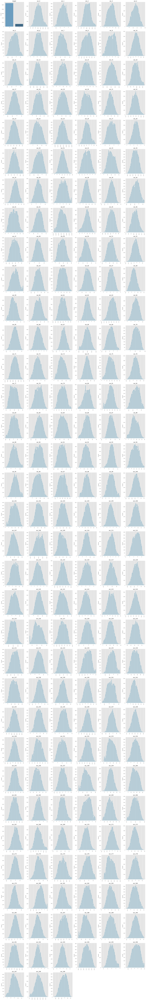

In [23]:
graph_stats(train_set, sample_frac=0.05, n_cols=6)

<div dir="rtl" align="right">
    <h3>סיכום</h3>
    <ul>
        <li><h3>עמודת המטרה הינה ערך בינארי.</h3></li>
        <li><h3>קיימים 200 מאפיינים נוספים (0-199).</h3></li>
    </ul>
    <h3>ניתוח גרפי ההתפלגות</h3>
    <ul>
        <li><h3>עמודת המטרה (Target) אינה מאוזנת (יחס של 9:1).</h3></li>
        <li><h3>שאר המאפיינים (Features) מתפלגים בצורה נורמלית, מה שמעיד על נתונים תקינים ללא חריגות קיצוניות.</h3></li>
    </ul>
    <h3>מסקנה</h3>
    <ul>
        <li><h3>נדרש שימוש במדד מותאם - מדד שבודק עד כמה המודל יודע להבדיל בין לקוח שיבצע פעולה (1) לבין לקוח שלא יבצע פעולה (0) ולא רק האם "ניחוש" התוצאה הסופית הצליח. במקרה שלנו כאשר 90% מהערכים מעידים על אי ביצוע עסקה, גם מודל "טיפש" שרק מחזיר תמיד ערך 0 יהיה צודק ב-90% מהמקרים וזו אינה המטרה.</h3></li>
        <li>
            <h3>AUC (Area Under the Curve) - הוא מדד מותאם. זה הציון של גרף שנקרא ROC Curve שבוחן את היחס שבין:</h3>
            <ul style="margin-right: 20px;">
                <li><h3>True Positive Rate – עד כמה המודל הצליח לאתר את הלקוחות שבאמת ביצעו עסקה.</h3></li>
                <li><h3>False Positive Rate – עד כמה המודל סתם הציף לקוחות שלא התכוונו לבצע עסקה.</h3></li>
            </ul>
        </li>
    </ul>
    <h3>__________________________________________________________________________________________________________________________</h3>
</div>

<h3 dir="rtl" align="right">
המרת ערכי קטגוריות למספרים (Lable Encoding)</h3>

In [26]:
data = train_set.copy()
non_numeric_cols = data.select_dtypes(exclude=['number']).columns

for col in non_numeric_cols:
    data[col] = data[col].astype('category').cat.codes

<h3 dir="rtl" align="right">
פונקציה לחישוב סוגי קורלציות שונות
</h3>


In [28]:
def correlation_matrix(df, exclude_cols=['ID_code'], method='pearson', figsize=(20, 18), show_plot=True, sample_frac=0.05,
                       show_annot=False, return_df=True, random_state=42, verbose=False):
    df_work = df.sample(frac=sample_frac, random_state=random_state).copy()
    
    if exclude_cols:
        df_work = df_work.drop(columns=exclude_cols, errors='ignore')
    
    df_numeric = df_work.select_dtypes(include='number')
    cols = df_numeric.columns
    n_cols = len(cols)
    
    if n_cols == 0:
        raise ValueError("No numeric columns found in dataframe")
    
    if method in ['pearson', 'spearman']:
        corr_matrix = df_numeric.corr(method=method)
    else:
        corr_matrix = pd.DataFrame(np.zeros((n_cols, n_cols)), index=cols, columns=cols)
        np.fill_diagonal(corr_matrix.values, 1.0)
        
        for i in range(n_cols):
            for j in range(i + 1, n_cols):
                col_i, col_j = cols[i], cols[j]
                try:
                    if method == 'distance':
                        val = dcor.distance_correlation(df_numeric[col_i].values, df_numeric[col_j].values)
                    else:
                        raise ValueError(f"Unknown method: {method}")
                    
                    corr_matrix.loc[col_i, col_j] = val
                    corr_matrix.loc[col_j, col_i] = val
                except:
                    corr_matrix.loc[col_i, col_j] = np.nan
                    corr_matrix.loc[col_j, col_i] = np.nan
    
    if show_plot:
        plt.figure(figsize=figsize)
        
        sns.heatmap(corr_matrix.abs(), annot=corr_matrix if show_annot else False, fmt='.2f' if show_annot else '', 
                    vmin=0, vmax=1, cbar_kws={'label': 'Correlation Strength (Absolute)'}, square=True)
        
        plt.title(f"{method.capitalize()} Correlation Matrix\n(Color = Strength, Number = Direction)", 
                  fontsize=14, pad=20)
        plt.xticks(rotation=90, fontsize=8)
        plt.yticks(rotation=0, fontsize=8)
        plt.tight_layout()
        plt.show()
    
    if return_df:
        return corr_matrix

<h3 dir="rtl" align="right">
מטריצת קורלציה לינארית - פירסון
</h3>


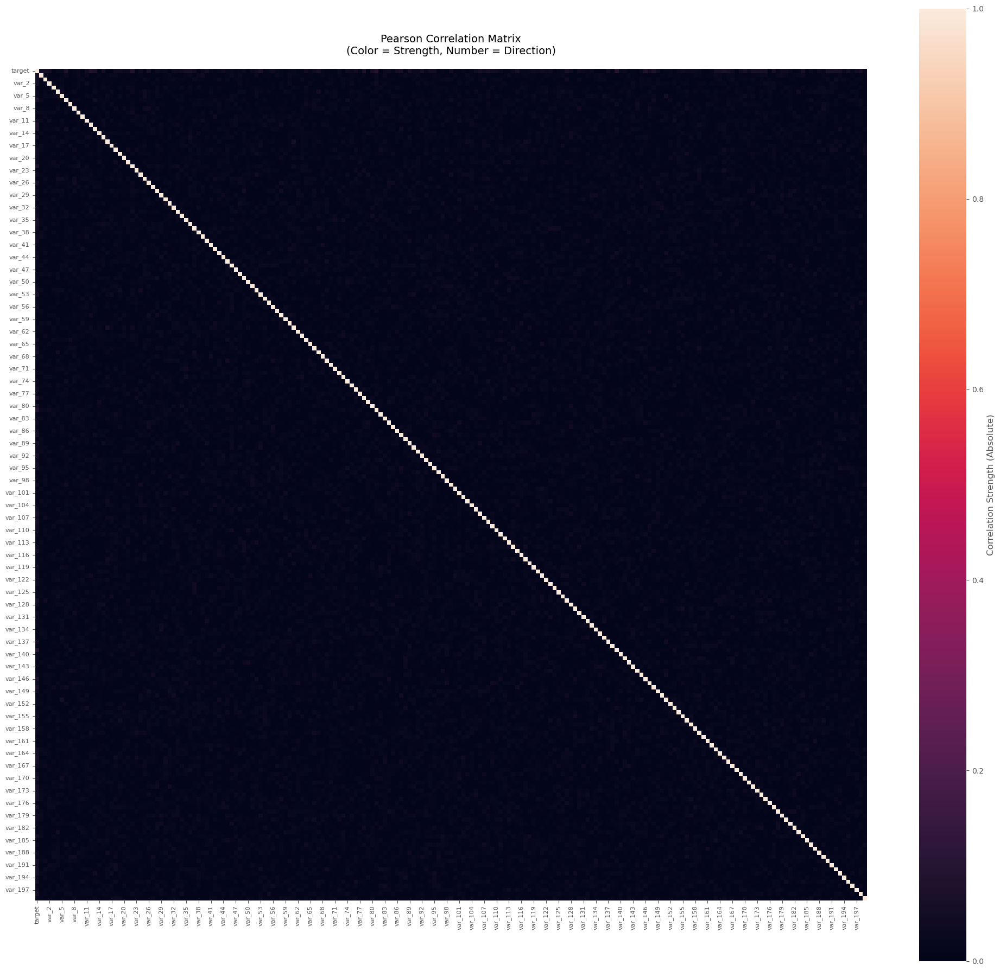

In [30]:
correlation_matrix(train_set, method='pearson', show_annot=False, sample_frac=0.05, figsize=(20, 18), return_df=False)

<div dir="rtl" align="right">
    <h3>מסקנה - לא קיימת קורלציה ליניארית בין המשתנים למטרה.</h3>
        <h3>__________________________________________________________________________________________________________________________</h3>
</div>

<h3 dir="rtl" align="right">
מטריצת קורלציה מונוטונית (מבוססת דירוג) - ספירמן
</h3>


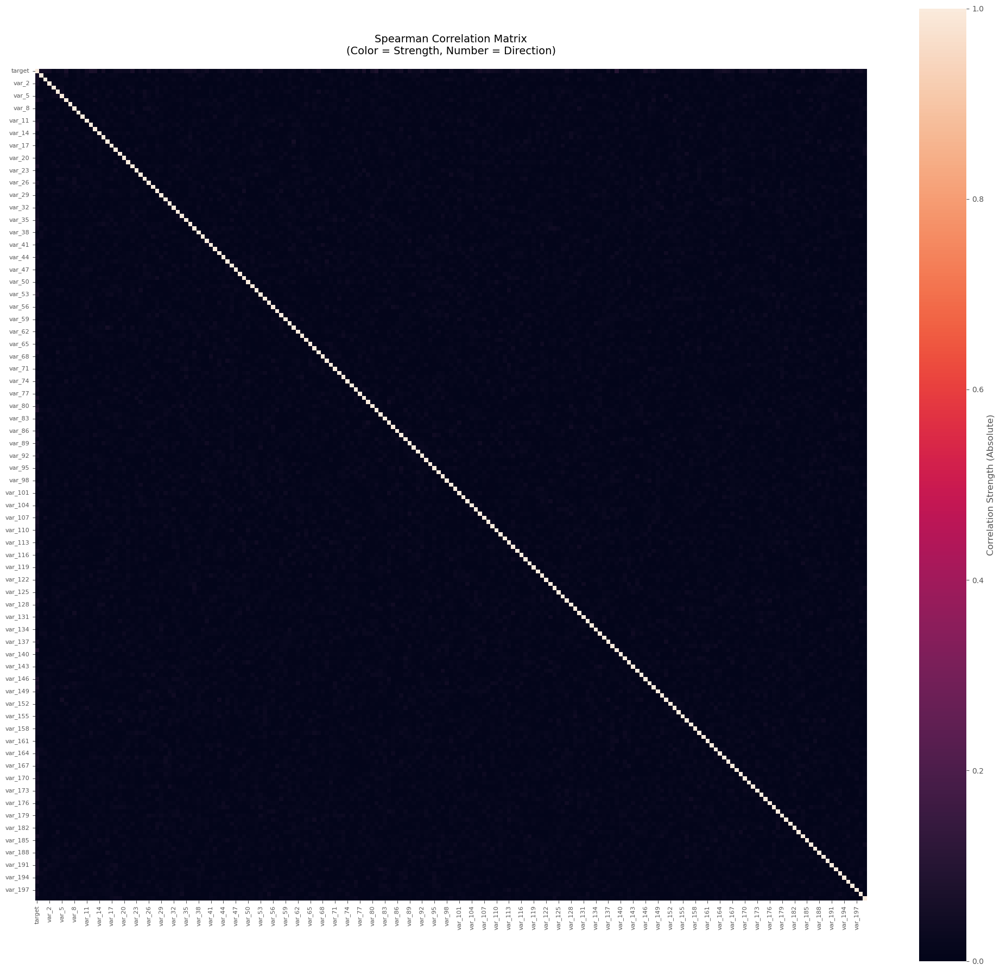

In [33]:
correlation_matrix(train_set, method='spearman', show_annot=False, sample_frac=0.05, figsize=(20, 18), return_df=False)

<div dir="rtl" align="right">
    <h3>מסקנה</h3>
            <h3>לא קיימת קורלציה מונוטונית בין המשתנים למטרה.</h3>        <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<h3 dir="rtl" align="right">
התפלגות ערכי משתנה המטרה: 
</h3>


In [36]:
pd.DataFrame({'Count': train_set['target'].value_counts(), 
              'Percentage': train_set['target'].value_counts(normalize=True).map('{:.2%}'.format)})

,Count,Percentage
target,,
0,108004,90.00%
1,11996,10.00%



<div dir="rtl" align="right">
    <h3>תהליך הנדסת מאפיינים (Feature Engineering)</h3>
    <h3>יצירת סוגים שונים של מדדים עבור כל לקוח (רשומה) בהתייחסות לכלל המשתנים</h3>
    <ul>
        <li><h3> מדדי תיאור סטטיסטיים (סכום, ממוצע, חציון, ערכי קיצון וטווח) במטרה לאפיין את עוצמת הפעילות הכללית ואת רמת הפיזור.</h3></li>
        <li><h3> מדדי התפלגות סטטיסטיים (Skewness, Kurtosis) המאפשרים לזהות חוסר סימטריה או חריגות.</h3></li>
        <li><h3> מדדי שונות וסטיית תקן לצורך זיהוי רמת התנודתיות ביחס לממוצע.</h3></li>
        <li><h3> מקדם השתנות (CV - Coefficient of Variation) המנרמל את רמת הפיזור ביחס לממוצע, כדי לאפשר השוואה אובייקטיבית של תנודתיות ללא תלות בקנה מידה.</h3></li>
        <li><h3> מדדי רבעונים (Q1, Q3) וטווח בין-רבעוני (IQR) כדי לבחון את ריכוזיות הנתונים ולזהות ערכי קיצון.</h3></li>
        <li><h3> ערך שכיח (Mode) ומספר המופעים שלו לזיהוי ערכים דומיננטיים שחוזרים על עצמם באופן עקבי.</h3></li>
        <li><h3> מספר הערכים הייחודיים (Nunique) במטרה למדוד את רמת הגיוון.</h3></li>
        <li><h3> Frequency Encoding לכלל משתני ה-var המקוריים באמצעות ספירת שכיחות הערכים בקבוצת האימון, מה שמאפשר למודל להבחין בין ערכים נפוצים לערכים נדירים באוכלוסייה.</h3></li>
    </ul>       
</div>


In [38]:
df_train = train_set.copy()
df_val = val_set.copy()
df_test = test_set.copy()
df_prod = prod_set.copy()

In [39]:
datasets = [df_train, df_val, df_test, df_prod]

In [40]:
features = [c for c in df_train.columns if c.startswith('var_')]
print(f"Engineering features for {len(features)} original columns...")

Engineering features for 200 original columns...


In [41]:
for i in range(len(datasets)):
    df = datasets[i]
    df['row_sum']  = df[features].sum(axis=1)
    df['row_min']  = df[features].min(axis=1)
    df['row_max']  = df[features].max(axis=1)
    df['row_mean'] = df[features].mean(axis=1)
    df['row_std']  = df[features].std(axis=1)
    df['row_skew'] = df[features].skew(axis=1)
    df['row_kurt'] = df[features].kurtosis(axis=1)
    df['row_median'] = df[features].median(axis=1)
    df['row_range']  = df['row_max'] - df['row_min']
    df['row_var']    = df['row_std'] ** 2
    df['row_cv']     = df['row_std'] / (df['row_mean'].abs() + 1e-6)
    df['row_nunique'] = df[features].apply(lambda x: x.nunique(), axis=1)
    df['row_Q1']  = df[features].quantile(0.25, axis=1)
    df['row_Q3']  = df[features].quantile(0.75, axis=1)
    df['row_iqr'] = df['row_Q3'] - df['row_Q1']

    mode_res = stats.mode(df[features].values, axis=1, keepdims=True)
    df['row_mode']       = mode_res.mode[:, 0]
    df['row_mode_count'] = mode_res.count[:, 0]
    
    train_ref = datasets[0] 
    
    for col in features:
        counts = train_ref[col].value_counts()
        df[col + '_count'] = df[col].map(counts)
        if i > 0:
            df[col + '_count'] = df[col + '_count'].fillna(1)
            
    datasets[i] = df

In [42]:
df_train, df_val, df_test, df_prod = datasets

<h3 dir="rtl" align="right">
אנליזה של המאפיינים – הצגת כלל המדדים שחושבו (בנוסף למאפיינים המקוריים)
</h3>


In [44]:
check_df(df_train, transpose=True)

Dataset Shape: (120000, 419)
Total rows with at least one NULL: 0


,ID_code,row_Q1,row_Q3,row_cv,row_iqr,row_kurt,row_max,row_mean,row_median,row_min,row_mode,row_mode_count,row_nunique,row_range,row_skew,row_std,row_sum,row_var,target,var_0,var_0_count,var_1,var_10,var_100,var_100_count,var_101,var_101_count,var_102,var_102_count,var_103,var_103_count,var_104,var_104_count,var_105,var_105_count,var_106,var_106_count,var_107,var_107_count,var_108,var_108_count,var_109,var_109_count,var_10_count,var_11,var_110,var_110_count,var_111,var_111_count,var_112,var_112_count,var_113,var_113_count,var_114,var_114_count,var_115,var_115_count,var_116,var_116_count,var_117,var_117_count,var_118,var_118_count,var_119,var_119_count,var_11_count,var_12,var_120,var_120_count,var_121,var_121_count,var_122,var_122_count,var_123,var_123_count,var_124,var_124_count,var_125,var_125_count,var_126,var_126_count,var_127,var_127_count,var_128,var_128_count,var_129,var_129_count,var_12_count,var_13,var_130,var_130_count,var_131,var_131_count,var_132,var_132_count,var_133,var_133_count,var_134,var_134_count,var_135,var_135_count,var_136,var_136_count,var_137,var_137_count,var_138,var_138_count,var_139,var_139_count,var_13_count,var_14,var_140,var_140_count,var_141,var_141_count,var_142,var_142_count,var_143,var_143_count,var_144,var_144_count,var_145,var_145_count,var_146,var_146_count,var_147,var_147_count,var_148,var_148_count,var_149,var_149_count,var_14_count,var_15,var_150,var_150_count,var_151,var_151_count,var_152,var_152_count,var_153,var_153_count,var_154,var_154_count,var_155,var_155_count,var_156,var_156_count,var_157,var_157_count,var_158,var_158_count,var_159,var_159_count,var_15_count,var_16,var_160,var_160_count,var_161,var_161_count,var_162,var_162_count,var_163,var_163_count,var_164,var_164_count,var_165,var_165_count,var_166,var_166_count,var_167,var_167_count,var_168,var_168_count,var_169,var_169_count,var_16_count,var_17,var_170,var_170_count,var_171,var_171_count,var_172,var_172_count,var_173,var_173_count,var_174,var_174_count,var_175,var_175_count,var_176,var_176_count,var_177,var_177_count,var_178,var_178_count,var_179,var_179_count,var_17_count,var_18,var_180,var_180_count,var_181,var_181_count,var_182,var_182_count,var_183,var_183_count,var_184,var_184_count,var_185,var_185_count,var_186,var_186_count,var_187,var_187_count,var_188,var_188_count,var_189,var_189_count,var_18_count,var_19,var_190,var_190_count,var_191,var_191_count,var_192,var_192_count,var_193,var_193_count,var_194,var_194_count,var_195,var_195_count,var_196,var_196_count,var_197,var_197_count,var_198,var_198_count,var_199,var_199_count,var_19_count,var_1_count,var_2,var_20,var_20_count,var_21,var_21_count,var_22,var_22_count,var_23,var_23_count,var_24,var_24_count,var_25,var_25_count,var_26,var_26_count,var_27,var_27_count,var_28,var_28_count,var_29,var_29_count,var_2_count,var_3,var_30,var_30_count,var_31,var_31_count,var_32,var_32_count,var_33,var_33_count,var_34,var_34_count,var_35,var_35_count,var_36,var_36_count,var_37,var_37_count,var_38,var_38_count,var_39,var_39_count,var_3_count,var_4,var_40,var_40_count,var_41,var_41_count,var_42,var_42_count,var_43,var_43_count,var_44,var_44_count,var_45,var_45_count,var_46,var_46_count,var_47,var_47_count,var_48,var_48_count,var_49,var_49_count,var_4_count,var_5,var_50,var_50_count,var_51,var_51_count,var_52,var_52_count,var_53,var_53_count,var_54,var_54_count,var_55,var_55_count,var_56,var_56_count,var_57,var_57_count,var_58,var_58_count,var_59,var_59_count,var_5_count,var_6,var_60,var_60_count,var_61,var_61_count,var_62,var_62_count,var_63,var_63_count,var_64,var_64_count,var_65,var_65_count,var_66,var_66_count,var_67,var_67_count,var_68,var_68_count,var_69,var_69_count,var_6_count,var_7,var_70,var_70_count,var_71,var_71_count,var_72,var_72_count,var_73,var_73_count,var_74,var_74_count,var_75,var_75_count,var_76,var_76_count,var_77,var_77_count,var_78,var_78_count,var_79,var_79_count,var_7_count,var_8,var_80,var_80_count,var_81,var_81_count,var_82,var_82_count,var_83,var_83_count,v

<h3 dir="rtl" align="right">
אנליזה של המאפיינים – ניתוח סטטיסטי של כלל המדדים שחושבו (בנוסף למאפיינים המקוריים)
</h3>


In [46]:
df_train.describe().round(2)

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,row_sum,row_min,row_max,row_mean,row_std,row_skew,row_kurt,row_median,row_range,row_var,row_cv,row_nunique,row_Q1,row_Q3,row_iqr,row_mode,row_mode_count,var_0_count,var_1_count,var_2_count,var_3_count,var_4_count,var_5_count,var_6_count,var_7_count,var_8_count,var_9_count,var_10_count,var_11_count,var_12_count,var_13_count,var_14_count,var_15_count,var_16_count,var_17_count,var_18_count,var_19_count,var_20_count,var_21_count,var_22_count,var_23_count,var_24_count,var_25_count,var_26_count,var_27_count,var_28_count,var_29_count,var_30_count,var_31_count,var_32_count,var_33_count,var_34_count,var_35_count,var_36_count,var_37_count,var_38_count,var_39_count,var_40_count,var_41_count,var_42_count,var_43_count,var_44_count,var_45_count,var_46_count,var_47_count,var_48_count,var_49_count,var_50_count,var_51_count,var_52_count,var_53_count,var_54_count,var_55_count,var_56_count,var_57_count,var_58_count,var_59_count,var_60_count,var_61_count,var_62_count,var_63_count,var_64_count,var_65_count,var_66_count,var_67_count,var_68_count,var_69_count,var_70_count,var_71_count,var_72_count,var_73_count,var_74_count,var_75_count,var_76_count,var_77_count,var_78_count,var_79_count,var_80_count,var_81_count,var_82_count,var_83_count,var_84_count,var_85_count,var_86_count,var_87_count,var_88_count,var_89_count,var_90_count,var_91_count,var_92_count,var_93_count,var_94_count,var_95_count,var_96_count,var_97_count,var_98_count,var_99_count,var_100_count,var_101_count,var_102_count,var_103_count,var_104_count,var_105_count,var_106_count,var_107_count,var_108_count,var_109_count,var_110_count,var_111_count,var_112_count,var_113_count,var_114_count,var_115_count,var_116_count,var_117_count,var_118_count,var_119_count,var_120_count,var_121_count,var_122_count,var_123_count,var_124_count,var_125_count,var_126_count,var_127_count,var_128_count,var_129_count,var_130_count,var_131_count,var_132_count,var_133_count,var_134_count,var_135_count,var_136_count,var_137_count,var_138_count,var_139_count,var_140_count,var_141_count,var_142_count,var_143_count,var_144_count,var_145_count,var_146_count,var_147_count,var_148_count,var_149_count,var_150_count,var_151_count,var_152_count,var_153_count,var_154_count,var_155_count,var_156_count,var_157_count,var_158_count,var_159_count,var_160_count,var_161_count,var_162_count,var_163_count,var_164_count,var_165_count,var_166_count,var_167_count,var_168_count,var_169_count,var_170_count,var_171_count,var_172_count,var_173_count,var_174_count,var_175_c

<h3 dir="rtl" align="right">
כמות הרשומות וכמות המשתנים בכל Data Set
</h3>


In [48]:
print(f"df Train:       {df_train.shape}")
print(f"df Validation : {df_val.shape}")
print(f"df Test:        {df_test.shape}")
print(f"df Prediction:  {df_prod.shape}")

df Train:       (120000, 419)
df Validation : (40000, 419)
df Test:        (40000, 419)
df Prediction:  (200000, 418)


<h3 dir="rtl" align="right">
בקרה שאין ערכי Null ב Data
</h3>


In [50]:
print(f"Train Nulls: {df_train.isnull().sum().sum()}")
print(f"Val Nulls:   {df_val.isnull().sum().sum()}")
print(f"Test Nulls:  {df_test.isnull().sum().sum()}")
print(f"Prod Nulls:  {df_prod.isnull().sum().sum()}")

Train Nulls: 0
Val Nulls:   0
Test Nulls:  0
Prod Nulls:  0


<h3 dir="rtl" align="right">
הצגת 5 רשומות מתוך הנתונים (Train)
</h3>


In [52]:
df_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,row_sum,row_min,row_max,row_mean,row_std,row_skew,row_kurt,row_median,row_range,row_var,row_cv,row_nunique,row_Q1,row_Q3,row_iqr,row_mode,row_mode_count,var_0_count,var_1_count,var_2_count,var_3_count,var_4_count,var_5_count,var_6_count,var_7_count,var_8_count,var_9_count,var_10_count,var_11_count,var_12_count,var_13_count,var_14_count,var_15_count,var_16_count,var_17_count,var_18_count,var_19_count,var_20_count,var_21_count,var_22_count,var_23_count,var_24_count,var_25_count,var_26_count,var_27_count,var_28_count,var_29_count,var_30_count,var_31_count,var_32_count,var_33_count,var_34_count,var_35_count,var_36_count,var_37_count,var_38_count,var_39_count,var_40_count,var_41_count,var_42_count,var_43_count,var_44_count,var_45_count,var_46_count,var_47_count,var_48_count,var_49_count,var_50_count,var_51_count,var_52_count,var_53_count,var_54_count,var_55_count,var_56_count,var_57_count,var_58_count,var_59_count,var_60_count,var_61_count,var_62_count,var_63_count,var_64_count,var_65_count,var_66_count,var_67_count,var_68_count,var_69_count,var_70_count,var_71_count,var_72_count,var_73_count,var_74_count,var_75_count,var_76_count,var_77_count,var_78_count,var_79_count,var_80_count,var_81_count,var_82_count,var_83_count,var_84_count,var_85_count,var_86_count,var_87_count,var_88_count,var_89_count,var_90_count,var_91_count,var_92_count,var_93_count,var_94_count,var_95_count,var_96_count,var_97_count,var_98_count,var_99_count,var_100_count,var_101_count,var_102_count,var_103_count,var_104_count,var_105_count,var_106_count,var_107_count,var_108_count,var_109_count,var_110_count,var_111_count,var_112_count,var_113_count,var_114_count,var_115_count,var_116_count,var_117_count,var_118_count,var_119_count,var_120_count,var_121_count,var_122_count,var_123_count,var_124_count,var_125_count,var_126_count,var_127_count,var_128_count,var_129_count,var_130_count,var_131_count,var_132_count,var_133_count,var_134_count,var_135_count,var_136_count,var_137_count,var_138_count,var_139_count,var_140_count,var_141_count,var_142_count,var_143_count,var_144_count,var_145_count,var_146_count,var_147_count,var_148_count,var_149_count,var_150_count,var_151_count,var_152_count,var_153_count,var_154_count,var_155_count,var_156_count,var_157_count,var_158_count,var_159_count,var_160_count,var_161_count,var_162_count,var_163_count,var_164_count,var_165_count,var_166_count,var_167_count,var_168_count,var_169_count,var_170_count,var_171_count,var_172_count,var_173_count,var_174_count,v

<h3 dir="rtl" align="right">
תצוגה ויזואלית של התפלגות כל מאפיין לאחר הוספת המשתנים
</h3>

In [54]:
graph_stats(df_train, sample_frac=0.05, n_cols=6)

Visualization based on a 5.0% sample (6000 rows)


<div dir="rtl" align="right">
    <h3> מסקנות מניתוח התפלגות המאפיינים החדשים:</h3>
    <ul>
        <li><h3> מאפייני המרכז (row_sum, row_mean, row_median) כמו גם כלל המשתנים הרבעוניים (row_Q1, row_Q3, row_iqr) מתפלגים בצורה נורמלית סימטרית, מה שמעיד על כך שהמאפיינים המקוריים יציבים ועקביים וברובם בלתי תלויים או בעלי מתאם נמוך ביניהם.</h3></li>
        <li><h3> מרבית מאפייני השונות (row_std, row_cv, row_var) מתפלגים בצורה נורמלית סימטרית, מה שמעיד על כך שלרוב הרשומות יש רמת פיזור דומה סביב הממוצע.</h3></li>
        <li><h3> העובדה ש row_range, row_max, row_kurt  מתפלגים בצורה נורמלית עם זנב ימני בעוד ש row_min, row_skew מתפלגים בצורה נורמלית עם זנב שמאלי מעידה על כך שקיימים ערכי קיצון "חדים" שמחד מושכים את הטווח כלפי מעלה בעוד יש  ערכים נמוכים המעידים על חוסר יציבות או כשל נקודתי.</h3></li>
        <li><h3> מדד הערכים הייחודיים (row_nunique) מציג שונות בין ערכי הנתונים השונים (199-200) מה שמעיד על כך שכמעט כל מאפיין הכיל ערכים שונים.</h3></li>
        <li><h3> תדירויות המשתנים (var_*_count) שומרות על התפלגות דומה עם נטיה לרוב לערכים הנמוכים מעידה על כך שמרבית המאפיינים הינם בעלי תדירות נמוכה (נדירים יחסית).</h3></li>
    </ul>
    <h3> כמו כן בבדיקות התקינות לא נמצאו ערכים חסרים או שגיאות חישוב, והמאפיינים החדשים מוכנים להזנה למודלי הלמידה.</h3>
    <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<h3 dir="rtl" align="right">
מטריצת קורלציה לאחר הוספת העמודות
</h3>

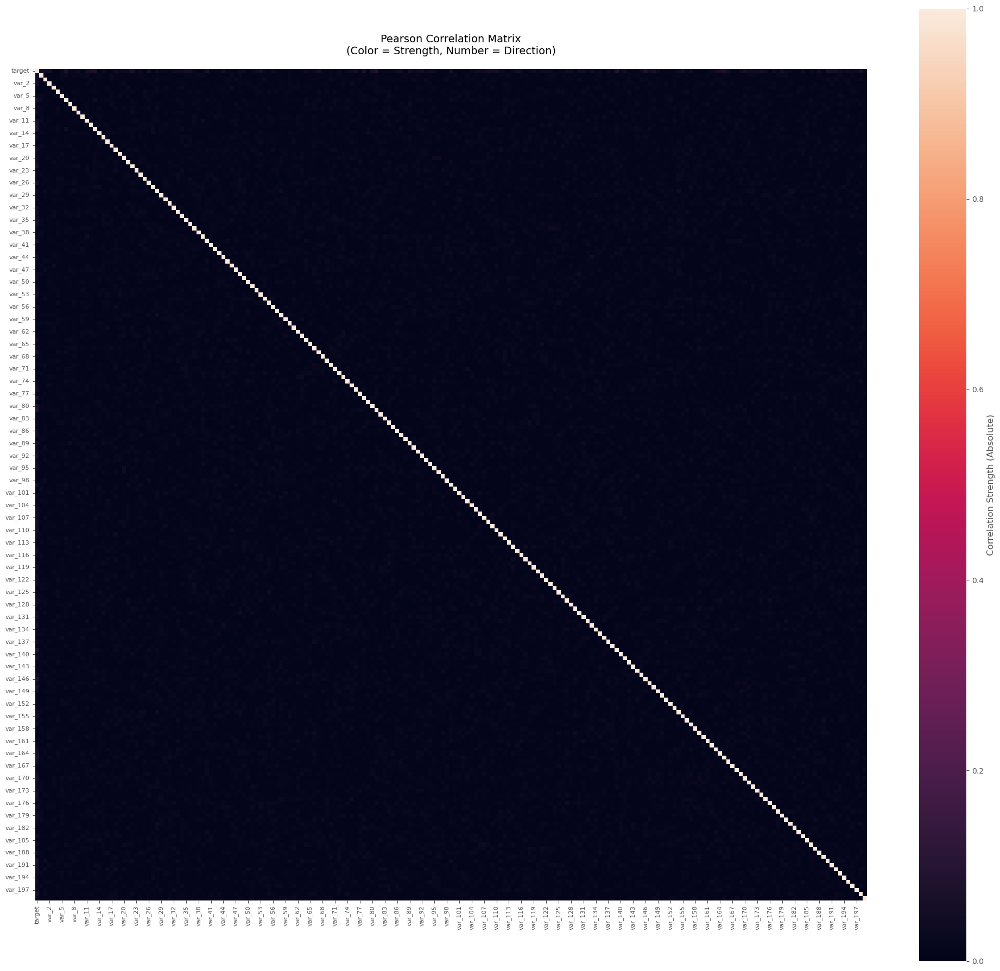

In [57]:
correlation_matrix(train_set, method='pearson', show_annot=False, sample_frac=0.083, figsize=(20, 18), return_df=False)

<div dir="rtl" align="right">
    <h3>
הגרף מציג העדר קורלציה ליניארית (Pearson) בין המשתנים. זהו יתרון המעיד על עצמאות סטטיסטית ומניעת כפילויות מידע, ומבטיח שכל מאפיין מספק זווית ייחודית למודל ומשפר את יציבות החיזוי.</h3>
        <h3>__________________________________________________________________________________________________________________________</h3>

</div>


<div dir="rtl" align="right">
        <h2>פיתוח המודלים והשוואה</h2>
    <h3>הכנת הנתונים לאימון (Data Preparation)</h3>
    <ul> 
        <li><h3>חלוקת הנתונים למערך תכונות (X) הכולל את כל המאפיינים, ומערך מטרה (Y) המכיל את משתנה היעד לחיזוי.</h3></li>
        <li><h3>יצירת עותק מנורמל עבור מודלים ליניאריים, כדי להבטיח שכל המשתנים יהיו בקנה מידה אחיד ולא יטו את תוצאות המודל בשל הבדלי יחידות.</h3></li>
        <li><h3>שמירה על מערך הנתונים המקורי עבור מודלים מבוססי עצים (כמו CatBoost ו-XGBoost), אשר מסוגלים לטפל בערכים גולמיים ללא צורך בנרמול מוקדם.</h3></li>
    </ul>
</div>


In [61]:
X_train, y_train = df_train.drop(columns=['target', 'ID_code']), df_train['target']
X_val, y_val     = df_val.drop(columns=['target', 'ID_code']), df_val['target']
X_test, y_test   = df_test.drop(columns=['target', 'ID_code']), df_test['target']
X_prod = df_prod.drop(columns=['ID_code'])

In [62]:
X_train_scaled = X_train.copy()
X_val_scaled   = X_val.copy()
X_test_scaled  = X_test.copy()
X_prod_scaled  = X_prod.copy()

num_cols = X_train.columns 

scalers = {}

for col in num_cols:
    sc = StandardScaler()

    X_train_scaled[col] = sc.fit_transform(X_train[[col]])
    X_val_scaled[col]  = sc.transform(X_val[[col]])
    X_test_scaled[col] = sc.transform(X_test[[col]])
    X_prod_scaled[col] = sc.transform(X_prod[[col]])   

    scalers[col] = sc

In [63]:
for col, sc in scalers.items():
    print(f"Feature: {col}")
    print(f"  Mean: {sc.mean_[0]:.2f}")
    print(f"  Standard Deviation: {sc.scale_[0]:.2f}")

Feature: var_0
  Mean: 10.68
  Standard Deviation: 3.03
Feature: var_1
  Mean: -1.64
  Standard Deviation: 4.05
Feature: var_2
  Mean: 10.71
  Standard Deviation: 2.64
Feature: var_3
  Mean: 6.80
  Standard Deviation: 2.05
Feature: var_4
  Mean: 11.08
  Standard Deviation: 1.62
Feature: var_5
  Mean: -5.07
  Standard Deviation: 7.87
Feature: var_6
  Mean: 5.41
  Standard Deviation: 0.86
Feature: var_7
  Mean: 16.55
  Standard Deviation: 3.42
Feature: var_8
  Mean: 0.28
  Standard Deviation: 3.33
Feature: var_9
  Mean: 7.57
  Standard Deviation: 1.23
Feature: var_10
  Mean: 0.40
  Standard Deviation: 5.50
Feature: var_11
  Mean: -3.24
  Standard Deviation: 5.97
Feature: var_12
  Mean: 14.02
  Standard Deviation: 0.19
Feature: var_13
  Mean: 8.54
  Standard Deviation: 4.63
Feature: var_14
  Mean: 7.54
  Standard Deviation: 2.25
Feature: var_15
  Mean: 14.57
  Standard Deviation: 0.41
Feature: var_16
  Mean: 9.33
  Standard Deviation: 2.56
Feature: var_17
  Mean: -5.71
  Standard Deviatio

<div dir="rtl" align="right">
    <h3>הערכת מודלים וניתוח Overfitting</h3>
    <h3>
        פיתוח פונקציה המבצעת הערכה רב-מדדית על 5 מדדים מרכזיים (Accuracy, Precision, Recall, F1, AUC) ומחשבת את הפערים בין ביצועי האימון לוולידציה לצורך זיהוי מהיר של Overfitting.
    </h3>
</div>


In [65]:
def evaluate_custom_models(X_train, y_train, X_val, y_val, custom_models_dict):

    results = []
    
    print("Detailed Model Performance Evaluation: Custom Selection")
    print("=" * 110)

    for name, model in custom_models_dict.items():
        model.fit(X_train, y_train)
        
        raw_tr_pred = model.predict(X_train)
        raw_v_pred = model.predict(X_val)
        
        tr_auc = np.nan
        v_auc = np.nan
        
        try:
            if hasattr(model, "predict_proba"):
                tr_proba = model.predict_proba(X_train)[:, 1]
                v_proba = model.predict_proba(X_val)[:, 1]
                tr_auc = roc_auc_score(y_train, tr_proba)
                v_auc = roc_auc_score(y_val, v_proba)
            elif "Linear Regression" in name:
                tr_auc = roc_auc_score(y_train, raw_tr_pred)
                v_auc = roc_auc_score(y_val, raw_v_pred)
        except Exception as e:
            pass

        if "Linear Regression" in name:
            y_train_pred = np.clip(np.round(raw_tr_pred), y_train.min(), y_train.max()).astype(int)
            y_val_pred = np.clip(np.round(raw_v_pred), y_train.min(), y_train.max()).astype(int)
        else:
            y_train_pred = raw_tr_pred
            y_val_pred = raw_v_pred
        
        print(f"\nModel: {name}")
        print("-" * 40)
        print("Classification Report (Validation Set):")
        labels = sorted(np.unique(y_val))
        print(classification_report(y_val, y_val_pred, labels=labels, zero_division=0))
        
        print("Confusion Matrix:")
        cm = confusion_matrix(y_val, y_val_pred, labels=labels)
        print(cm)
        print(f"Validation AUC: {v_auc:.4f}" if not np.isnan(v_auc) else "Validation AUC: N/A")
        print("-" * 80)
        
        results.append({
            'Model': name,
            'Tr_Acc': accuracy_score(y_train, y_train_pred),
            'V_Acc': accuracy_score(y_val, y_val_pred),
            'Tr_AUC': tr_auc,
            'V_AUC': v_auc,
            'Tr_Pre': precision_score(y_train, y_train_pred, average='weighted', zero_division=0),
            'V_Pre': precision_score(y_val, y_val_pred, average='weighted', zero_division=0),
            'Tr_Rec': recall_score(y_train, y_train_pred, average='weighted', zero_division=0),
            'V_Rec': recall_score(y_val, y_val_pred, average='weighted', zero_division=0),
            'Tr_F1': f1_score(y_train, y_train_pred, average='weighted', zero_division=0),
            'V_F1': f1_score(y_val, y_val_pred, average='weighted', zero_division=0)})

    summary_df = pd.DataFrame(results)
    
    cols = ['Model', 'Tr_Acc', 'V_Acc', 'Tr_AUC', 'V_AUC', 'Tr_Pre', 'V_Pre', 'Tr_Rec', 'V_Rec', 'Tr_F1', 'V_F1']
    
    print("\nSummary Table: Detailed Metric Comparison (Train vs Val)")
    print("=" * 140)
    print(summary_df[cols].to_string(index=False, formatters={c: '{:,.4f}'.format for c in summary_df.columns if c != 'Model'}))
    
    diff_df = pd.DataFrame()
    diff_df['Model'] = summary_df['Model']
    diff_df['Acc_Gap'] = summary_df['Tr_Acc'] - summary_df['V_Acc']
    diff_df['AUC_Gap'] = summary_df['Tr_AUC'] - summary_df['V_AUC']
    diff_df['Pre_Gap'] = summary_df['Tr_Pre'] - summary_df['V_Pre']
    diff_df['Rec_Gap'] = summary_df['Tr_Rec'] - summary_df['V_Rec']
    diff_df['F1_Gap'] = summary_df['Tr_F1'] - summary_df['V_F1']

    print("\nDifference Table: Overfitting Analysis (Train - Val)")
    print("-" * 140)
    print(diff_df.to_string(index=False, formatters={c: '{:,.4f}'.format for c in diff_df.columns if c != 'Model'}))
    
    return summary_df, diff_df, custom_models_dict

<div dir="rtl" align="right">
    <h3>בחירת המודלים (Model Selection)</h3>
    <h3>הגדרת מודלים ממשפחות שונות במטרה לאתר את המודל בעל פוטנציאל החיזוי הגבוה ביותר:</h3>
        <ul>
        <li><h3>  מודלים ליניאריים על נתונים מנורמלים.</h3></li>
        <li><h3>  מודלי עצים על הנתונים הגולמיים.</h3></li>
     </ul>
</div>


In [67]:
models_scaled = {'Linear Regression (LPM)': LinearRegression(),
                 'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42)}

models_raw = {'Decision Tree': DecisionTreeClassifier(random_state=42),
              'Random Forest': RandomForestClassifier(n_jobs=-1, random_state=42),
              'XGBoost': XGBClassifier(n_jobs=-1, eval_metric='logloss', random_state=42),
              'LightGBM': LGBMClassifier(n_jobs=-1, random_state=42, verbose=-1),
              'LGBM_RF': LGBMClassifier(boosting_type='rf', bagging_fraction=0.8, bagging_freq=1, n_jobs=-1, random_state=42, verbose=-1),
              'CatBoost': CatBoostClassifier(verbose=0, random_state=42)}

In [68]:
summary_scaled, diff_scaled, _ = evaluate_custom_models(X_train_scaled, y_train, X_val_scaled, y_val, models_scaled)
print("=" * 110)
summary_raw, diff_raw, _ = evaluate_custom_models(X_train, y_train, X_val, y_val, models_raw)

final_summary = pd.concat([summary_scaled, summary_raw], ignore_index=True)
final_summary = final_summary.sort_values(by='V_AUC', ascending=False).reset_index(drop=True)

final_diff = pd.concat([diff_scaled, diff_raw], ignore_index=True)
final_diff = final_diff.set_index('Model').reindex(final_summary['Model']).reset_index()

cols_summary = ['Model', 'Tr_Acc', 'V_Acc', 'Tr_AUC', 'V_AUC', 'Tr_Pre', 'V_Pre', 'Tr_Rec', 'V_Rec', 'Tr_F1', 'V_F1']
cols_diff = ['Model', 'Acc_Gap', 'AUC_Gap', 'Pre_Gap', 'Rec_Gap', 'F1_Gap']

print("\nSummary: Model Comparison (Sorted by V_AUC)")
print("=" * 140)
print(final_summary[cols_summary].to_string(index=False, float_format='%.4f'))

print("\nOverfitting Analysis (Train - Val)")
print("=" * 140)
print(final_diff[cols_diff].to_string(index=False, float_format='%.4f'))

Detailed Model Performance Evaluation: Custom Selection

Model: Linear Regression (LPM)
----------------------------------------
Classification Report (Validation Set):
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     35963
           1       0.84      0.12      0.21      4037

    accuracy                           0.91     40000
   macro avg       0.88      0.56      0.58     40000
weighted avg       0.90      0.91      0.88     40000

Confusion Matrix:
[[35870    93]
 [ 3541   496]]
Validation AUC: 0.8730
--------------------------------------------------------------------------------

Model: Logistic Regression
----------------------------------------
Classification Report (Validation Set):
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     35963
           1       0.51      0.51      0.51      4037

    accuracy                           0.90     40000
   macro avg       0.73 

<div dir="rtl" align="right"> 
    <h3>מסקנות מהשוואת ביצועי המודלים:</h3> 
    <h3>מודל CatBoost הוא המנצח המובהק בביצועים עם מדד AUC של 0.8933, מה שמעיד את יכולתו לחלץ את המידע הרב ביותר מהמאפיינים החדשים שיצרתי.</h3>
    <h3>לאור התוצאות, בחרתי להמשיך לשלב הבא עם שני המודלים שהשיגו את ה-AUC הגבוה ביותר: </h3>
    <ul>
<li><h3>  CatBoost</h3></li>
<li><h3> Logistic Regression</h3></li>
    </ul>
    <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<div dir="rtl" align="right">
  <h3>ניתוח חשיבות המאפיינים (Feature Importance)</h3>
  <h3>
    פיתוח פונקציה המחלצת עבור כל מודל את תרומת כל מאפיין, את חשיבותו, מציגה ויזואליזציה של המאפיינים המובילים ומחזירה טבלה מדורגת לצורך בחירת המאפיינים.
  </h3>
</div>


In [71]:
def feature_importance(model, feature_names, model_name, transpose=False):
    
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 20000)
    
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
    elif hasattr(model, 'coef_'):
        importances = np.abs(model.coef_[0])
    else:
        print(f"Warning: Model {model_name} does not have feature importances or coefficients.")
        return None

    df = pd.DataFrame({'Feature': feature_names, 
                       'Importance': importances}).sort_values(by='Importance', ascending=False).reset_index(drop=True)

    total_width = max(10, len(feature_names) * 0.25) 
    height = 12
    
    plt.figure(figsize=(total_width, height))
    
    sns.barplot(x='Feature', y='Importance', data=df, color='#1f77b4') 
    
    plt.title(f'Feature Importance: {model_name}', fontsize=30)
    plt.ylabel('Importance', fontsize=20)
    plt.xlabel('Features', fontsize=20)
    
    plt.xticks(rotation=90, fontsize=12) 
    
    sns.despine()
    plt.margins(x=0.005)
    plt.show()
    
    print(f"Full List for {model_name}:")
    print("-" * 30)
    
    if transpose:
        display(df.set_index('Feature').T)
    else:
        print(df)
    
    return df

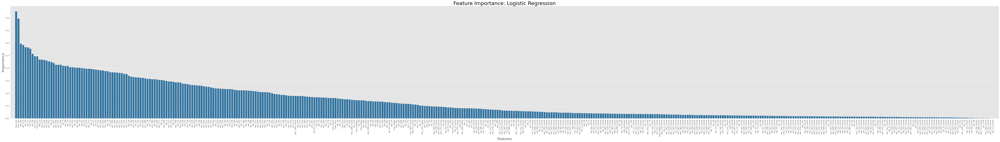

Full List for Logistic Regression:
------------------------------


Feature,row_std,row_var,var_90,var_174,var_40,var_21,var_81,var_26,var_165,row_kurt,row_cv,var_172,var_118,var_139,var_107,var_6,var_187,var_146,var_170,var_190,var_5,var_99,var_12,var_13,var_120,var_75,var_109,var_33,var_61,var_22,var_147,var_173,var_1,var_47,var_53,var_110,var_198,var_164,var_199,var_76,var_92,var_166,var_160,var_167,var_157,var_155,var_102,var_133,var_34,var_44,var_179,var_82,var_135,var_87,var_169,var_188,var_56,var_78,var_180,var_80,var_136,var_177,var_0,var_108,var_2,var_121,var_191,var_9,var_148,var_11,var_154,var_89,var_52,var_134,var_32,var_115,var_100,var_35,var_94,var_149,var_192,var_123,var_128,var_197,var_95,var_71,var_150,var_104,var_176,var_85,var_20,var_73,var_119,var_86,var_91,var_145,var_77,var_186,var_84,var_36,var_196,var_45,var_171,var_106,var_142,var_122,var_194,var_31,var_30,var_162,var_117,var_158,var_93,var_17,var_138,var_97,var_127,var_132,var_112,var_148_count,var_184,var_111,var_131,var_195,var_105,var_67,var_101,var_81_count,var_43,var_74,var_130,var_140,var_23,var_114,var_8,row_mean,row_sum,var_28,var_70,row_min,var_125,var_62,var_156,var_108_count,var_129,row_median,var_58,row_range,var_143,var_163,var_166_count,var_24,var_88,row_iqr,var_96,var_151,var_185,var_69,var_144,var_93_count,var_50,row_mode,var_141,var_66,var_168,var_116,var_65,var_175,var_169_count,var_53_count,var_18,var_113,var_15,var_125_count,var_152,row_Q1,var_57,var_59,var_156_count,var_28_count,var_105_count,var_133_count,var_64,var_95_count,var_6_count,var_193,var_91_count,var_0_count,var_115_count,row_Q3,var_146_count,var_7,var_10,var_183,var_153,var_43_count,var_34_count,var_109_count,var_99_count,var_22_count,var_41,var_181,var_112_count,var_110_count,var_39,var_189,var_177_count,var_170_count,var_195_count,var_50_count,var_198_count,var_42,var_68,var_139_count,var_25,var_121_count,var_23_count,var_182,var_3,var_124,var_178_count,var_106_count,var_89_count,var_1_count,var_8_count,var_193_count,var_44_count,var_191_count,var_144_count,var_188_count,var_194_count,var_56_count,var_68_count,var_78_count,var_26_count,var_132_count,var_107_count,row_skew,var_15_count,var_62_count,var_197_count,var_2_count,var_38,var_14,var_4,var_69_count,var_82_count,var_75_count,var_111_count,var_46_count,var_9_count,var_163_count,var_179_count,var_74_count,var_142_count,var_67_count,var_98_count,var_29,var_76_count,row_nunique,var_92_count,var_120_count,var_159,var_77_count,var_113_count,var_150_count,var_17_count,var_64_count,var_37,var_182_count,var_19,var_118_count,var_73_count,var_131_count,row_mode_count,var_124_count,var_3_count,var_167_count,var_129_count,var_155_count,var_145_count,var_16_count,var_187_count,var_180_count,var_25_count,var_38_count,var_60_count,var_161_count,var_96_count,var_160_count,var_158_count,var_154_count,var_61_count,var_151_count,var_84_count,var_162_count,var_7_count,var_49,var_32_count,var_83,var_128_count,var_14_count,var_16,var_171_count,row_max,var_36_count,var_147_count,var_12_count,var_48,var_65_count,var_104_count,var_192_count,var_79_count,var_190_count,var_103,var_97_count,var_70_count,var_98,var_87_count,var_41_count,var_138_count,var_127_count,var_85_count,var_86_count,var_55_count,var_72,var_143_count,var_176_count,var_47_count,var_49_count,var_19_count,var_13_count,var_175_count,var_101_count,var_116_count,var_137,var_39_count,var_58_count,var_72_count,var_183_count,var_114_count,var_102_count,var_174_count,var_134_count,var_196_count,var_31_count,var_79,var_185_count,var_199_count,var_186_count,var_71_count,var_94_count,var_29_count,var_21_count,var_33_count,var_184_count,var_60,var_63,var_119_count,var_42_count,var_24_count,var_27_count,var_130_count,var_189_count,var_83_count,var_123_count,var_27,var_35_count,var_90_count,var_172_count,var_54,var_141_count,var_5_count,var_126_count,var_66_count,var_137_count,var_51_count,var_159_count,var_45_count,var_157_count,var_80_count,var_181_count,var_51,var_126,var_10_count,var_135_count,var_152_count,var_165_count,var_122_count,var_18_cou

In [72]:
lr_df = feature_importance(models_scaled['Logistic Regression'], X_train.columns, 'Logistic Regression', transpose=True)

<div dir="rtl" align="right"> 
    <h3>ניתוח חשיבות המאפיינים - Logistic Regression:</h3>
<h3>ניכר כי יש 2 המאפיינים שתפסו את המקומות הראשונים מובילים משמעותית מעבר לאחרים, שניהם מדדי שונות</h3>
        <ul>
<li><h3> row_std </h3></li>
<li><h3> row_var </h3></li>
              </ul>  
<h3>גם מדדי שונות נוספים (row_kurt, row_cv) הופיעו בעשירייה הפותחת.</h3>
</div>


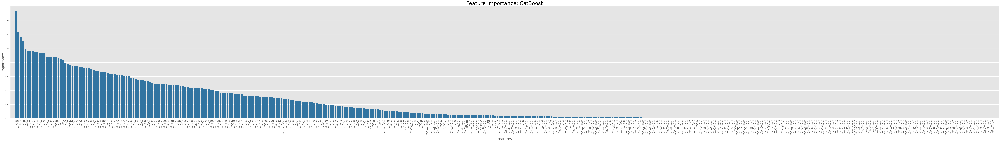

Full List for CatBoost:
------------------------------


Feature,var_81,var_139,var_6,var_12,var_53,var_26,var_174,var_166,var_133,var_110,var_76,var_146,var_22,var_13,var_165,var_99,var_190,var_21,var_80,var_0,var_2,var_34,var_198,var_40,var_44,var_170,var_78,var_1,var_33,var_169,var_109,var_148,var_94,var_92,var_149,var_184,var_191,var_121,var_122,var_9,var_18,var_179,var_192,var_154,var_115,var_173,var_164,var_177,var_127,var_108,var_36,var_123,var_75,var_87,var_86,var_147,var_67,var_91,var_95,var_56,var_172,var_107,var_155,var_106,var_188,var_71,var_163,var_157,var_197,var_89,var_49,var_5,var_35,var_145,var_118,var_141,var_180,var_93,var_150,var_48,var_162,var_24,var_32,var_131,var_130,var_119,var_137,var_58,var_104,var_167,var_128,var_186,var_43,var_132,var_151,var_125,var_111,var_112,var_85,var_90,var_175,var_23,var_105,var_114,var_116,var_28,var_51,var_83,var_196,var_135,var_178,var_45,var_144,var_70,var_108_count,var_199,var_52,var_195,var_31,var_88,var_82,var_168,var_20,var_194,var_11,var_102,var_156,var_77,var_193,var_142,var_66,row_cv,var_171,var_113,var_55,var_50,var_187,var_54,var_8,var_15,var_134,var_72,var_140,var_138,var_181,var_59,var_74,var_62,var_97,var_152,var_143,row_kurt,var_63,var_68,var_120,var_4,var_69,var_44_count,var_19,var_129,var_25,var_159,var_3,var_84,var_101,row_max,var_5_count,var_182,var_26_count,var_57,var_64,var_46,var_60,var_153,var_39,var_123_count,var_65,var_91_count,var_135_count,var_147_count,var_68_count,var_27,row_sum,var_160,var_16,var_80_count,var_86_count,var_37,var_102_count,var_42,var_154_count,var_174_count,row_std,row_iqr,var_179_count,var_41,row_range,var_13_count,row_mean,var_170_count,var_126_count,row_Q1,var_176,var_96,row_min,var_124,var_82_count,var_117,var_148_count,var_81_count,var_114_count,var_119_count,var_187_count,var_198_count,var_36_count,var_12_count,var_47,var_125_count,var_100,var_165_count,var_190_count,row_mode,var_155_count,var_73,var_161,var_105_count,var_49_count,var_50_count,var_29,var_163_count,var_40_count,var_143_count,var_6_count,var_61,var_18_count,var_126,var_136,var_131_count,var_2_count,var_162_count,var_158,var_132_count,var_184_count,var_52_count,var_93_count,var_33_count,var_164_count,var_166_count,var_111_count,var_79,var_103_count,var_149_count,row_median,var_98,var_32_count,row_var,var_96_count,var_30,var_89_count,var_183,var_59_count,var_139_count,var_29_count,var_169_count,var_88_count,var_180_count,var_185,var_172_count,var_73_count,var_153_count,var_156_count,var_112_count,var_16_count,var_103,var_39_count,var_78_count,var_141_count,var_199_count,var_0_count,var_173_count,var_182_count,var_109_count,var_110_count,var_10,var_193_count,var_145_count,var_71_count,var_30_count,var_14,var_79_count,var_38,var_98_count,var_106_count,var_28_count,var_63_count,var_20_count,var_186_count,var_23_count,var_76_count,var_197_count,row_skew,var_161_count,var_41_count,var_85_count,var_7,var_34_count,var_8_count,var_122_count,var_64_count,var_168_count,var_171_count,var_104_count,var_142_count,var_46_count,var_45_count,var_60_count,var_133_count,var_188_count,var_138_count,var_84_count,var_69_count,row_Q3,var_72_count,var_97_count,var_47_count,var_17,var_51_count,var_189,var_159_count,var_185_count,var_192_count,var_191_count,var_31_count,var_54_count,var_38_count,var_87_count,var_160_count,var_128_count,var_17_count,var_19_count,var_21_count,var_22_count,var_24_count,var_25_count,var_107_count,var_27_count,var_167_count,var_176_count,var_35_count,var_37_count,var_42_count,var_43_count,var_175_count,var_15_count,var_177_count,var_178_count,row_nunique,row_mode_count,var_196_count,var_195_count,var_194_count,var_1_count,var_3_count,var_189_count,var_4_count,var_7_count,var_9_count,var_10_count,var_183_count,var_11_count,var_181_count,var_14_count,var_157_count,var_158_count,var_53_count,var_48_count,var_95_count,var_77_count,var_83_count,var_130_count,var_129_count,var_127_count,var_92_count,var_124_count,var_94_count,var_121_count,var_101_count,var_120_count,var_99_count,var_118_count,var_117_count,var_116_co

In [74]:
cb_df = feature_importance(models_raw['CatBoost'], X_train.columns, 'CatBoost', transpose=True)

<div dir="rtl" align="right"> 
    <h3>ניתוח חשיבות המאפיינים - CatBoost:</h3>
<h3>את מרבית המקומות המובילים תפסו משתני המקור. את המקום הראשון, בפער משמעותי, תפס  var_81.</h3>
<h3>בולט ההבדל בין המודלים בחשיבות המשתנים (הן ברמת סוג המשתנים הבולטים והן ברמת ההתפלגות החשיבות).</h3>
        <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<div dir="rtl" align="right">
    <h3>אופטימיזציה של כמות המאפיינים ומניעת Overfitting</h3>
    <h3>פונקציה המבצעת חיפוש הדרגתי לאיתור מספר המאפיינים האופטימלי עבור כל מודל, באופן שמבטיח בחירת מאפיינים התורמים לדיוק המודל ללא הכנסת רעש מיותר:
 </h3>
        <ul>
        <li><h3> נקודת עצירה מוקדמת (נקודת אופטימום)</h3></li>
    <li><h3> נקודת מקסימום</h3></li>
                </ul>
</div>


In [77]:
def scan_features(model_obj, model_name, X_train, X_val, y_train, y_val, limit=418):
    if hasattr(model_obj, 'feature_importances_'):
        importances = model_obj.feature_importances_
    elif hasattr(model_obj, 'coef_'):
        importances = np.abs(model_obj.coef_[0])
    else:
        print(f"Warning: Could not retrieve feature importances for {model_name}")
        return pd.DataFrame()

    feat_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances}).sort_values('Importance', ascending=False)
    
    results = []
    model_params = model_obj.get_params()
    
    if 'verbose' in model_params: model_params['verbose'] = 0
    if 'verbosity' in model_params: model_params['verbosity'] = 0
    if 'n_jobs' in model_params and "CatBoost" not in model_name: model_params['n_jobs'] = -1
    
    limit = min(limit, len(X_train.columns))
    print(f"Scanning {model_name} (1 to {limit})...")

    for count in range(1, limit + 1):
        top_feats = feat_df.iloc[:count]['Feature'].tolist()
        
        if "XGB" in model_name: temp_model = xgb.XGBClassifier(**model_params)
        elif "LightGBM" in model_name: temp_model = lgb.LGBMClassifier(**model_params)
        elif "CatBoost" in model_name: temp_model = cb.CatBoostClassifier(**model_params)
        elif "Logistic" in model_name: temp_model = LogisticRegression(**model_params)
        else: temp_model = RandomForestClassifier(**model_params)
            
        temp_model.fit(X_train[top_feats], y_train)
        v_proba = temp_model.predict_proba(X_val[top_feats])[:, 1]
        v_auc = roc_auc_score(y_val, v_proba)
        
        results.append({'n_features': count, 'V_AUC': v_auc})
        
        if count % 50 == 0: 
            print(f"{model_name}: {count} feats -> AUC {v_auc:.4f}")

    return pd.DataFrame(results)

In [78]:
cb_results = scan_features(models_raw['CatBoost'], "CatBoost", X_train, X_val, y_train, y_val, limit=418)
lr_results = scan_features(models_scaled['Logistic Regression'], "Logistic Regression", X_train_scaled, X_val_scaled, y_train, y_val, limit=418)

Scanning CatBoost (1 to 417)...
CatBoost: 50 feats -> AUC 0.8431
CatBoost: 100 feats -> AUC 0.8830
CatBoost: 150 feats -> AUC 0.8918
CatBoost: 200 feats -> AUC 0.8934
CatBoost: 250 feats -> AUC 0.8930
CatBoost: 300 feats -> AUC 0.8924
CatBoost: 350 feats -> AUC 0.8933
CatBoost: 400 feats -> AUC 0.8934
Scanning Logistic Regression (1 to 417)...
Logistic Regression: 50 feats -> AUC 0.7888
Logistic Regression: 100 feats -> AUC 0.8488
Logistic Regression: 150 feats -> AUC 0.8659
Logistic Regression: 200 feats -> AUC 0.8720
Logistic Regression: 250 feats -> AUC 0.8729
Logistic Regression: 300 feats -> AUC 0.8731
Logistic Regression: 350 feats -> AUC 0.8731
Logistic Regression: 400 feats -> AUC 0.8731


In [79]:
results_map = {'CatBoost': cb_results, 
               'Logistic Regression': lr_results}

data = []

for name, df in results_map.items():
    if df is None or df.empty: continue
    max_row = df.loc[df['V_AUC'].idxmax()]
    data.append({'Model': f'{name} (MAX AUC)',
                 'AUC': max_row['V_AUC'],
                 'Features': int(max_row['n_features'])    })

    is_drop = df['V_AUC'] < df['V_AUC'].cummax()
    opt_row = df[is_drop.cumsum() == 0].iloc[-1]
    
    data.append({'Model': f'{name} (OPT)',
                 'AUC': opt_row['V_AUC'],
                 'Features': int(opt_row['n_features'])    })

opt_summary_df = pd.DataFrame(data).sort_values(by='AUC', ascending=False).reset_index(drop=True)
opt_summary_df

,Model,AUC,Features
0,CatBoost (MAX AUC),0.8935,228
1,Logistic Regression (MAX AUC),0.8731,413
2,CatBoost (OPT),0.8608,65
3,Logistic Regression (OPT),0.8604,126


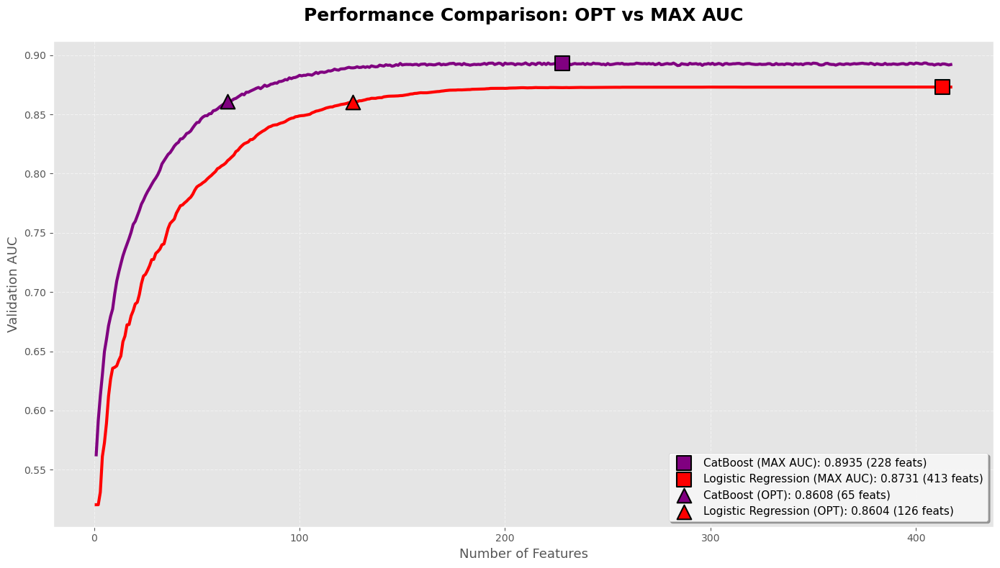

In [80]:
plt.figure(figsize=(14, 8))
plt.plot(cb_results['n_features'], cb_results['V_AUC'], color='purple', linewidth=3, label='_nolegend_')
plt.plot(lr_results['n_features'], lr_results['V_AUC'], color='red', linewidth=3, label='_nolegend_')

for i, row in opt_summary_df.iterrows():
    color = 'purple' if 'CatBoost' in row['Model'] else 'red'
    if 'MAX' in row['Model']:
        marker = 's'
        size = 200 
    else:
        marker = '^'
        size = 200 
    legend_label = f"{row['Model']}: {row['AUC']:.4f} ({int(row['Features'])} feats)"
    plt.scatter(row['Features'], row['AUC'], color=color, marker=marker, s=size, edgecolors='black', linewidth=1.5, zorder=10, label=legend_label)

plt.title('Performance Comparison: OPT vs MAX AUC', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of Features', fontsize=13)
plt.ylabel('Validation AUC', fontsize=13)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='lower right', fontsize=11, frameon=True, shadow=True, facecolor='white', framealpha=0.9)
plt.tight_layout()
plt.show()

<div dir="rtl" align="right">
    <h3>ניתוח עלות-תועלת: הכרעה לטובת נקודת האופטימום בשני המודלים</h3>
    <h3>הגרף מראה בצורה ברורה כי הן במודל ה - CatBoost והן במול ה -Logistic Regression, נקודת האופטימום היא הבחירה המשתלמת ביותר ביחס לנקודת המקסימום.</h3>
    <ul>
        <li>
            <h3>
                ב-CatBoost: הבחירה בנקודת המקסימום דורשת פי 3.5 יותר מאפיינים (228 לעומת 65) עבור שיפור שולי בלבד, מה שהופך את נקודת האופטימום ליעילה בהרבה.
            </h3>
        </li>
        <li>
            <h3>
                ב-Logistic Regression: התמונה דומה, כאשר נקודת המקסימום דורשת מאות מאפיינים נוספים (413 לעומת 126) לעומת נקודת האופטימום עבור תוספת זניחה לחלוטין לדיוק.
            </h3>
        </li>
    </ul>
    <h3>מסקנה: בשני המקרים, "מחיר" הסיבוכיות בנקודת המקסימום גבוה משמעותית מהתועלת, ולכן נקודת האופטימום נבחרה כנקודת העבודה האידיאלית בשני המקרים.</h3>
        <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<div dir="rtl" align="right"> <h3>איחוד נתונים לניתוח ביצועים השוואתי</h3> 
    <h3>ריכוז כלל תוצאות הסריקה של חשיבות המאפיינים למבנה נתונים אחוד מאפשר בחינה וחישוב של העלות השולית הפוחתת של כל מאפיין נוסף, מה שמסייע בזיהוי מדויק של נקודת הרוויה והחיתוך האופטימלית עבור כל מודל בנפרד.</h3>
</div>


In [83]:
comparison_df = pd.merge(cb_results.rename(columns={'V_AUC': 'CB_AUC'}), 
                         lr_results.rename(columns={'V_AUC': 'LR_AUC'}), 
                         on='n_features', 
                         how='outer')

comparison_df = comparison_df.sort_values('n_features').reset_index(drop=True)
comparison_df['CB_Improvement'] = comparison_df['CB_AUC'].diff()
comparison_df['LR_Improvement'] = comparison_df['LR_AUC'].diff()

In [84]:
comparison_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416
n_features,1.0000,2.0000,3.0000,4.0000,5.0000,6.0000,7.0000,8.0000,9.0000,10.0000,11.0000,12.0000,13.0000,14.0000,15.0000,16.0000,17.0000,18.0000,19.0000,20.0000,21.0000,22.0000,23.0000,24.0000,25.0000,26.0000,27.0000,28.0000,29.0000,30.0000,31.0000,32.0000,33.0000,34.0000,35.0000,36.0000,37.0000,38.0000,39.0000,40.0000,41.0000,42.0000,43.0000,44.0000,45.0000,46.0000,47.0000,48.0000,49.0000,50.0000,51.0000,52.0000,53.0000,54.0000,55.0000,56.0000,57.0000,58.0000,59.0000,60.0000,61.0000,62.0000,63.0000,64.0000,65.0000,66.0000,67.0000,68.0000,69.0000,70.0000,71.0000,72.0000,73.0000,74.0000,75.0000,76.0000,77.0000,78.0000,79.0000,80.0000,81.0000,82.0000,83.0000,84.0000,85.0000,86.0000,87.0000,88.0000,89.0000,90.0000,91.0000,92.0000,93.0000,94.0000,95.0000,96.0000,97.0000,98.0000,99.0000,100.0000,101.0000,102.0000,103.0000,104.0000,105.0000,106.0000,107.0000,108.0000,109.0000,110.0000,111.0000,112.0000,113.0000,114.0000,115.0000,116.0000,117.0000,118.0000,119.0000,120.0000,121.0000,122.0000,123.0000,124.0000,125.0000,126.0000,127.0000,128.0000,129.0000,130.0000,131.0000,132.0000,133.0000,134.0000,135.0000,136.0000,137.0000,138.0000,139.0000,140.0000,141.0000,142.0000,143.0000,144.0000,145.0000,146.0000,147.0000,148.0000,149.0000,150.0000,151.0000,152.0000,153.0000,154.0000,155.0000,156.0000,157.0000,158.0000,159.0000,160.0000,161.0000,162.0000,163.0000,164.0000,165.0000,166.0000,167.0000,168.0000,169.0000,170.0000,171.0000,172.0000,173.0000,174.0000,175.0000,176.0000,177.0000,178.0000,179.0000,180.0000,181.0000,182.0000,183.0000,184.0000,185.0000,186.0000,187.0000,188.0000,189.0000,190.0000,191.0000,192.0000,193.0000,194.0000,195.0000,196.0000,197.0000,198.0000,199.0000,200.0000,201.0000,202.0000,203.0000,204.0000,205.0000,206.0000,207.0000,208.0000,209.0000,210.0000,211.0000,212.0000,213.0000,214.0000,215.0000,216.0000,217.0000,218.0000,219.0000,220.0000,221.0000,222.0000,223.0000,224.0000,225.0000,226.0000,227.0000,228.0000,229.0000,230.0000,231.0000,232.0000,233.0000,234.0000,235.0000,236.0000,237.0000,238.0000,239.0000,240.0000,241.0000,242.0000,243.0000,244.0000,245.0000,246.0000,247.0000,248.0000,249.0000,250.0000,251.0000,252.0000,253.0000,254.0000,255.0000,256.0000,257.0000,258.0000,259.0000,260.0000,261.0000,262.0000,263.0000,264.0000,265.0000,266.0000,267.0000,268.0000,269.0000,270.0000,271.0000,272.0000,273.0000,274.0000,275.0000,276.0000,277.0000,278.0000,279.0000,280.0000,281.0000,282.0000,

<div dir="rtl" align="right"> <h3>חילוץ תצורת העבודה האופטימלית </h3> 
    <h3>איתור והצגת נקודות האופטימום עבור כל אחד מהמודלים המגדירות את מספר המאפיינים המדויק שהביא לביצועי ה-AUC המקסימליים לאורך כל תהליך הסריקה של חשיבות הנתונים.</h3>
    <h3>תחילה חישבתי את ההפרש בין כל זוג מאפיינים ואז בדקתי את הנקודה בה הוספת מאפיין (הפרש בין מאפיינים), לא רק שלא גורמת לשיפור אלא אף גורעת.</h3>
        <ul>
        <li>
            <h3>ניתוח התרומה השולית: הצגת השיפור המצטבר של כל מאפיין, ומאפשרת לזהות בדיוק מתי המידע הופך לרעש סטטיסטי.</h3>
        </li>
        <li>
            <h3>חיתוך מדויק: הגדרת הגבול רק בנקודת הדעיכה המוחלטת מאפשרת למודל "לדלג" על תנודות רגעיות ולמצות את הלמידה.</h3>
        </li>
                </ul>
</div>


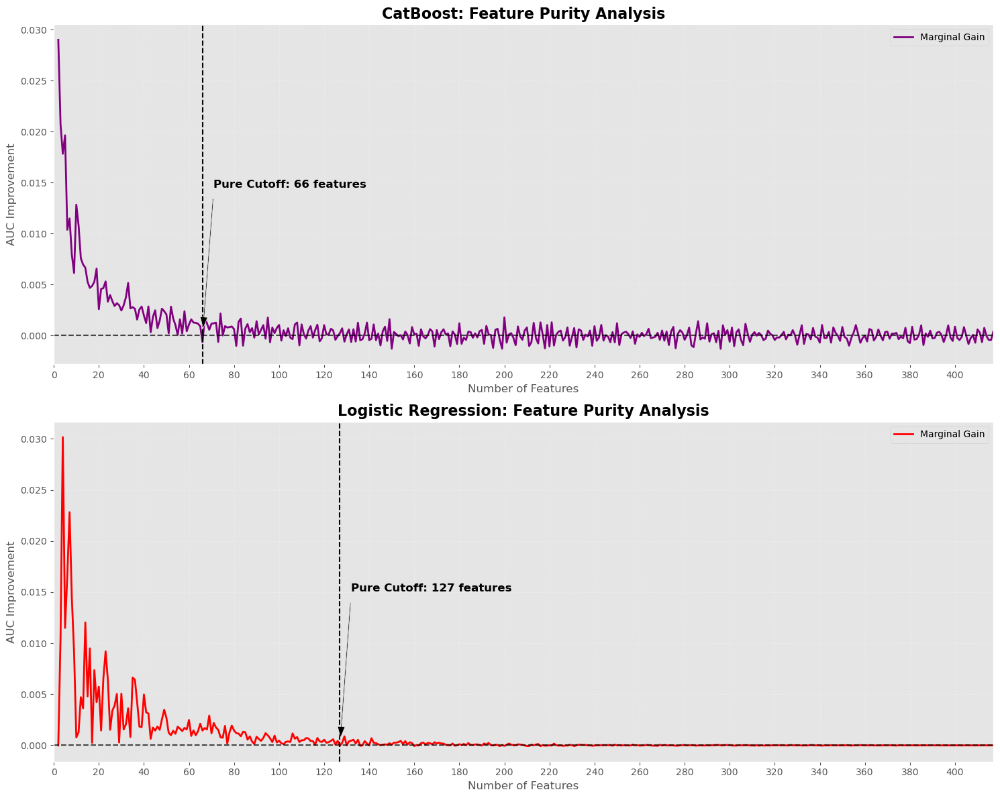

In [86]:
def find_first_stop(df):
    if df is None or df.empty:
        return None
    stop_row = df[(df['Improvement'] < 0) & (df['n_features'] > 1)]
    if not stop_row.empty:
        return stop_row['n_features'].iloc[0]
    return df['n_features'].max()

models_data = [(cb_results, 'CatBoost', 'purple'),
               (lr_results, 'Logistic Regression', 'red')]

for df, title, color in models_data:
    if df is not None and not df.empty:
        df['Improvement'] = df['V_AUC'].diff()

fig, axes = plt.subplots(2, 1, figsize=(15, 12)) 

for i, (df, title, color) in enumerate(models_data):
    ax = axes[i]
    
    if df is None or df.empty:
        ax.text(0.5, 0.5, 'No Data', ha='center')
        ax.set_title(f'{title} (No Data)')
        continue

    ax.plot(df['n_features'], df['Improvement'], color=color, linewidth=2, label='Marginal Gain')
    first_stop_x = find_first_stop(df)
    ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
    
    if first_stop_x:
        ax.axvline(x=first_stop_x, color='black', linestyle='--', linewidth=1.5)        
        y_text_pos = df['Improvement'].max() / 2 if df['Improvement'].max() > 0 else 0.01
        ax.annotate(f'Pure Cutoff: {first_stop_x} features', xy=(first_stop_x, 0), xytext=(first_stop_x + 5, y_text_pos),
                      arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8), fontsize=12, fontweight='bold', color='black')

    ax.set_title(f'{title}: Feature Purity Analysis', fontsize=16, fontweight='bold')
    ax.set_ylabel('AUC Improvement', fontsize=12)
    ax.set_xlabel('Number of Features', fontsize=12)
    
    if df is not None and not df.empty:
        ax.set_xlim(0, df['n_features'].max())
        ax.set_xticks(range(0, int(df['n_features'].max()) + 1, 20))
    
    ax.grid(True, which='both', linestyle=':', alpha=0.4)
    ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

<div dir="rtl" align="right">
    <h3>אופטימיזציה של התועלת השולית ומניעת נקודת עצירה שגויה</h3>
            <h3> גישה זו איפשרה מיצוי פוטנציאל מלא לכל מודל בנפרד בהתאם לרגישות הייחודית של כל אחד מהמודלים.</h3>
    <ul>
        <li>
            <h3> עצירה אופטימלית ב-65 (אחת לפני 66 בה יש ירידה) מאפיינים במודל ה-CatBoost.</h3>
        </li>
        <li>
            <h3> עצירה אופטימלית ב-126 (אחת לפני 127 בה יש ירידה) מאפיינים במודל ה- Logistic Regression.</h3>
        </li>
    </ul>
            <h3> נתונים אלו מאמתים את הבחירה בנקודת האופטימום (למול הנקודה המקסימלית) בגרף הקודם.</h3>
        <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<div dir="rtl" align="right">
    <h3>הגדרת תצורת נתונים סופית ומוכנות לאימון  </h3>
    <h3>בניית מערכי נתונים ייעודיים המותאמים לכל אלגוריתם על בסיס כמות המאפיינים האופטימלית שזוהתה. שלב זה מהווה אימות סופי למוכנותם של המודלים (CatBoost ו-Logistic Regression), ומבטיח כי כל מודל יפעל בתנאים האידיאליים עבורו להשגת יציבות וביצועי שיא בשלב האימון. </h3>
</div>


In [89]:
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_val_scaled_df   = pd.DataFrame(X_val_scaled,   columns=X_val.columns,   index=X_val.index)
X_test_scaled_df  = pd.DataFrame(X_test_scaled,  columns=X_test.columns,  index=X_test.index)
X_prod_scaled_df  = pd.DataFrame(X_prod_scaled,  columns=X_prod.columns,  index=X_prod.index)

all_datasets = {}

print(f"{'Dataset Name':<30} | {'Shape':<20} | {'Features'}")
print("-" * 70)

for i, row in opt_summary_df.iterrows():
    if 'OPT' not in row['Model']: 
        continue

    n_feats = int(row['Features'])
    
    if 'CatBoost' in row['Model']:
        suffix = 'CB'
        curr_model = models_raw['CatBoost']
        data_source = {'X_train': X_train, 'X_val': X_val, 'X_test': X_test,   'X_prod': X_prod}
        importances = curr_model.feature_importances_
        
    else:
        suffix = 'LR'
        curr_model = models_scaled['Logistic Regression']
        data_source = {'X_train': X_train_scaled_df, 'X_val': X_val_scaled_df, 'X_test': X_test_scaled_df,   'X_prod': X_prod_scaled_df}
        importances = np.abs(curr_model.coef_[0])

    top_cols = pd.Series(importances, index=X_train.columns).nlargest(n_feats).index.tolist()

    for stage_name, df_origin in data_source.items():
        new_key = f"{stage_name}_{suffix}"
        all_datasets[new_key] = df_origin[top_cols].copy()
        print(f"{new_key:<30} | {str(all_datasets[new_key].shape):<20} | {n_feats}")

    print("-" * 70)

Dataset Name                   | Shape                | Features
----------------------------------------------------------------------
X_train_CB                     | (120000, 65)         | 65
X_val_CB                       | (40000, 65)          | 65
X_test_CB                      | (40000, 65)          | 65
X_prod_CB                      | (200000, 65)         | 65
----------------------------------------------------------------------
X_train_LR                     | (120000, 126)        | 126
X_val_LR                       | (40000, 126)         | 126
X_test_LR                      | (40000, 126)         | 126
X_prod_LR                      | (200000, 126)        | 126
----------------------------------------------------------------------


<div dir="rtl" align="right"> <h3>אופטימיזציית היפר-פרמטרים: CatBoost </h3>
    <h3>ביצוע סריקת שכבה הבוחנת 288 שילובים למיקסום מדד ה-AUC מעבר לנקודת הבסיס (0.8608): </h3>
    <ul> <li><h3>Iterations [1000, 1200]: הגדרת תקרת העצים לבחינת פוטנציאל הלמידה מהמאפיינים הנבחרים.</h3></li>
        <li><h3>Learning Rate [0.01, 0.03, 0.05]: כיול גודל הצעד להשגת התכנסות מדויקת למינימום פונקציית ההפסד.</h3></li> 
        <li><h3>Depth [4, 6, 8, 10]: קביעת מורכבות העץ ליצירת הפרדה מיטבית בין המחלקות ללא הכנסת רעשים.</h3></li> 
        <li><h3>Scale Pos Weight [1, 5, 9, 12]: כיוונון היחס בין המחלקות לשיפור ה-Recall וזיהוי מקרי המטרה.</h3></li> 
        <li><h3>L2 Regularization [1, 5, 9]: הפעלת מנגנון ענישה לייצוב הלמידה ומניעת הסתמכות יתר על מאפיינים בודדים.</h3></li> 
    </ul> <h3>מנגנון בקרה: שימוש ב-Early Stopping של 50 סבבים לעצירת האימון בנקודת השיא ומניעת שינון יתר.</h3> </div>


In [91]:
baseline_cb = opt_summary_df.loc[opt_summary_df['Model'] == 'CatBoost (OPT)', 'AUC'].values[0]

final_data = {'CatBoost': {'X_train': all_datasets['X_train_CB'],
                           'X_val':   all_datasets['X_val_CB']}}

print("CatBoost")
print(f"Target to beat: {baseline_cb:.4f}")
print("-" * 100)

best_auc_cat = baseline_cb
best_cat_model = None
best_cat_params = {}

for iters in [1000, 1200]:
    for lr in [0.01, 0.03, 0.05]:
        for depth in [4, 6, 8, 10]:
            for scale in [1, 5, 9, 12]:
                for l2_leaf_reg in [1, 5, 9]:
                    
                    model = CatBoostClassifier(iterations=iters, learning_rate=lr, depth=depth, scale_pos_weight=scale, l2_leaf_reg=l2_leaf_reg,
                                               random_state=42, verbose=0, allow_writing_files=False)
                    
                    model.fit(final_data['CatBoost']['X_train'], y_train, eval_set=(final_data['CatBoost']['X_val'], y_val), early_stopping_rounds=50, 
                              verbose=False)
                    
                    probs = model.predict_proba(final_data['CatBoost']['X_val'])[:, 1]
                    preds = model.predict(final_data['CatBoost']['X_val'])
                    
                    auc = roc_auc_score(y_val, probs)
                    
                    if auc > best_auc_cat:
                        best_auc_cat = auc
                        best_cat_model = model
                        
                        best_cat_params = {'iters_limit': iters, 'actual_trees': model.tree_count_, 'lr': lr, 'depth': depth, 'scale': scale, 
                                           'l2': l2_leaf_reg}
                        
                        acc = accuracy_score(y_val, preds)
                        prec = precision_score(y_val, preds, zero_division=0)
                        rec = recall_score(y_val, preds)
                        f1 = f1_score(y_val, preds)
                        
                        print(f"NEW BEST CatBoost > AUC: {auc:.4f} (+{auc-baseline_cb:.4f})")
                        print(f"   Stats: F1: {f1:.4f} | Rec: {rec:.4f} | Prec: {prec:.4f} | Acc: {acc:.4f}")
                        print(f"   Params: {best_cat_params}")
                        print("-" * 50)

print("=" * 100)
print(f"CatBoost Best AUC: {best_auc_cat:.5f}")

CatBoost
Target to beat: 0.8608
----------------------------------------------------------------------------------------------------
NEW BEST CatBoost > AUC: 0.8610 (+0.0003)
   Stats: F1: 0.3864 | Rec: 0.8207 | Prec: 0.2527 | Acc: 0.7369
   Params: {'iters_limit': 1000, 'actual_trees': 1000, 'lr': 0.03, 'depth': 4, 'scale': 12, 'l2': 1}
--------------------------------------------------
NEW BEST CatBoost > AUC: 0.8613 (+0.0005)
   Stats: F1: 0.4966 | Rec: 0.5725 | Prec: 0.4384 | Acc: 0.8829
   Params: {'iters_limit': 1000, 'actual_trees': 1000, 'lr': 0.03, 'depth': 6, 'scale': 5, 'l2': 1}
--------------------------------------------------
NEW BEST CatBoost > AUC: 0.8617 (+0.0009)
   Stats: F1: 0.4932 | Rec: 0.5742 | Prec: 0.4322 | Acc: 0.8809
   Params: {'iters_limit': 1000, 'actual_trees': 1000, 'lr': 0.03, 'depth': 6, 'scale': 5, 'l2': 5}
--------------------------------------------------
NEW BEST CatBoost > AUC: 0.8619 (+0.0011)
   Stats: F1: 0.4396 | Rec: 0.7258 | Prec: 0.3153 | A

<div dir="rtl" align="right"> >
<h3>אופטימיזציית היפר-פרמטרים: Logistic Regression </h3>
    <h3>התאמת המודל הליניארי ל-126 המאפיינים המנורמלים להשגת יציבות ודיוק מקסימלי:</h3>
    <ul> <li><h3>C [0.01, 0.1, 1, 10, 100]: ויסות עוצמת הרגולריזציה למציאת האיזון בין גמישות המודל למניעת Overfitting.</h3></li>
        <li><h3>Penalty [L1, L2]: בחינת סוג הענישה; L1 לבחירת מאפיינים (איפוס מקדמים) או L2 לצמצום משקלים שוויוני.</h3></li>
        <li><h3>Class Weight [Balanced, None, 1:3, 1:5, 1:10]: שקלול מחלקות לשיפור זיהוי המחלקה הנדירה.</h3></li>
    </ul> <h3>ניהול החיפוש: שימוש ב-solver מסוג 'liblinear' התומך ב-L1, תוך שמירת הקונפיגורציה המיטבית לפי מדד ה-AUC.</h3> </div>


In [93]:
baseline_lr = opt_summary_df.loc[opt_summary_df['Model'] == 'Logistic Regression (OPT)', 'AUC'].values[0]

final_data = {'Logistic Regression': {'X_train': all_datasets['X_train_LR'],
                                      'X_val':   all_datasets['X_val_LR']}}

print("Logistic Regression")
print(f"Target to beat: {baseline_lr:.4f}")
print("-" * 100)

best_auc_lr = baseline_lr
best_lr_model = None
best_lr_params = {}

for C in [0.01, 0.1, 1, 10, 100]:
    for penalty in ['l1', 'l2']:
        
        weight_options = ['balanced', 
                          None,
                          {0: 1, 1: 3}, 
                          {0: 1, 1: 5}, 
                          {0: 1, 1: 10}]
        
        for weight in weight_options:
            
            model = LogisticRegression(C=C, penalty=penalty, solver='liblinear', class_weight=weight, 
                                       max_iter=1000, random_state=42)
            
            try:
                X_train_curr = final_data['Logistic Regression']['X_train']
                X_val_curr = final_data['Logistic Regression']['X_val']
                
                model.fit(X_train_curr, y_train)
                
                probs = model.predict_proba(X_val_curr)[:, 1]
                preds = model.predict(X_val_curr)
                
                auc = roc_auc_score(y_val, probs)
                
                if auc > best_auc_lr:
                    best_auc_lr = auc
                    best_lr_model = model
                    weight_str = str(weight)
                    best_lr_params = {'C': C, 'penalty': penalty, 'weight': weight_str}
                    
                    acc = accuracy_score(y_val, preds)
                    prec = precision_score(y_val, preds, zero_division=0)
                    rec = recall_score(y_val, preds)
                    f1 = f1_score(y_val, preds)
                    
                    print(f"NEW BEST LR > AUC: {auc:.4f} (+{auc-baseline_lr:.4f})")
                    print(f"   Stats: F1: {f1:.4f} | Rec: {rec:.4f} | Prec: {prec:.4f} | Acc: {acc:.4f}")
                    print(f"   Params: {best_lr_params}")
                    print("-" * 50)
            except Exception as e: 
                continue

print("=" * 100)
print(f"Logistic Regression Best AUC: {best_auc_lr:.5f}")

Logistic Regression
Target to beat: 0.8604
----------------------------------------------------------------------------------------------------
NEW BEST LR > AUC: 0.8604 (+0.0000)
   Stats: F1: 0.4932 | Rec: 0.5246 | Prec: 0.4654 | Acc: 0.8912
   Params: {'C': 0.01, 'penalty': 'l2', 'weight': '{0: 1, 1: 3}'}
--------------------------------------------------
NEW BEST LR > AUC: 0.8604 (+0.0000)
   Stats: F1: 0.4749 | Rec: 0.6510 | Prec: 0.3738 | Acc: 0.8547
   Params: {'C': 0.01, 'penalty': 'l2', 'weight': '{0: 1, 1: 5}'}
--------------------------------------------------
NEW BEST LR > AUC: 0.8605 (+0.0000)
   Stats: F1: 0.3837 | Rec: 0.2660 | Prec: 0.6880 | Acc: 0.9137
   Params: {'C': 0.1, 'penalty': 'l1', 'weight': 'None'}
--------------------------------------------------
NEW BEST LR > AUC: 0.8605 (+0.0001)
   Stats: F1: 0.4924 | Rec: 0.5234 | Prec: 0.4649 | Acc: 0.8911
   Params: {'C': 0.1, 'penalty': 'l1', 'weight': '{0: 1, 1: 3}'}
-------------------------------------------------

In [94]:
opt_summary_df = opt_summary_df[opt_summary_df['Model'].str.contains('OPT')].copy()
opt_summary_df['Tuned AUC'] = np.where(opt_summary_df['Model'].str.contains('CatBoost'), best_auc_cat, best_auc_lr)
opt_summary_df['Gain'] = opt_summary_df['Tuned AUC'] - opt_summary_df['AUC']
opt_summary_df = opt_summary_df.rename(columns={'AUC': 'Baseline AUC'})
opt_summary_df = opt_summary_df[['Model', 'Features', 'Baseline AUC', 'Tuned AUC', 'Gain']]
opt_summary_df

,Model,Features,Baseline AUC,Tuned AUC,Gain
2,CatBoost (OPT),65,0.8608,0.8626,0.0018
3,Logistic Regression (OPT),126,0.8604,0.8605,0.0001


<div dir="rtl" align="right">
    <h3>סיכום אופטימיזציה: ניתוח תוצאות ומיצוי יכולת החיזוי</h3>
    <h3>תהליך אופטימיזצית ההיפר פרמטרים הוביל לשיפור AUC של 0.8626 במודל ה-CatBoost, הודות לזיהוי דפוסים מורכבים ב-65 המאפיינים שנבחרו.</h3>
    <h3>מודל ה-Logistic Regression שמר על יציבות (0.8605), דבר המעיד על הגעה לנקודת רוויה ומיצוי פוטנציאל החיזוי ב 126 המאפיינים שנבחרו.</h3>
    <h3>התכנסות שני המודלים לאזור ה-0.86+ AUC מצביעה על הגעה לחסם העליון של יכולת החיזוי ומבטיחה תשתית יציבה.</h3>
        <h3>__________________________________________________________________________________________________________________________</h3>
</div>


<div dir="rtl" align="right">
    <h3>סיכום הגדרות המודלים ואימות ביצועים סופי</h3>
    <h3>בשלב זה מגובשות הגרסאות האופטימליות של 2 המודלים (CatBoost ו-Logistic Regression) על בסיס הפרמטרים שנמצאו בתהליך. </h3>
    <h3>מטרת ההרצה הנוכחית היא לבצע אימות סופי של המדדים וניתוח Overfitting כדי להבטיח יציבות מקסימלית לפני המעבר לבדיקה על נתוני ה Test. </h3>
</div>


In [97]:
X_train_LR = all_datasets['X_train_LR']
X_val_LR   = all_datasets['X_val_LR']
X_test_LR  = all_datasets['X_test_LR']
X_prod_LR  = all_datasets['X_prod_LR']

X_train_CB = all_datasets['X_train_CB']
X_val_CB   = all_datasets['X_val_CB']
X_test_CB  = all_datasets['X_test_CB']
X_prod_CB  = all_datasets['X_prod_CB']

In [98]:
configs = [('Optimized Logistic Regression',
            LogisticRegression(**best_lr_model.get_params()), 
            X_train_LR, X_val_LR),
           ('Optimized CatBoost', 
            CatBoostClassifier(**best_cat_model.get_params()), 
            X_train_CB, X_val_CB)]

In [99]:
all_summaries = []
all_diffs = []

print("Running optimized models...")

for name, model, X_tr, X_v in configs:
    summ, dif, _ = evaluate_custom_models(X_tr, y_train, X_v, y_val, {name: model})
    all_summaries.append(summ)
    all_diffs.append(dif)

final_summary = pd.concat(all_summaries, ignore_index=True).sort_values('V_AUC', ascending=False)
final_diff = pd.concat(all_diffs, ignore_index=True).set_index('Model').reindex(final_summary['Model']).reset_index()

cols_sum = ['Model', 'Tr_Acc', 'V_Acc', 'Tr_AUC', 'V_AUC', 'Tr_Pre', 'V_Pre', 'Tr_Rec', 'V_Rec', 'Tr_F1', 'V_F1']
cols_dif = ['Model', 'Acc_Gap', 'AUC_Gap', 'Pre_Gap', 'Rec_Gap', 'F1_Gap']

print("\nFinal Results:\n" + "="*100)
print(final_summary[cols_sum].to_string(index=False))
print("\nOverfitting Analysis:\n" + "-"*100)
print(final_diff[cols_dif].to_string(index=False))

Running optimized models...
Detailed Model Performance Evaluation: Custom Selection

Model: Optimized Logistic Regression
----------------------------------------
Classification Report (Validation Set):
              precision    recall  f1-score   support

           0       0.95      0.93      0.94     35963
           1       0.46      0.52      0.49      4037

    accuracy                           0.89     40000
   macro avg       0.70      0.73      0.72     40000
weighted avg       0.90      0.89      0.89     40000

Confusion Matrix:
[[33515  2448]
 [ 1919  2118]]
Validation AUC: 0.8605
--------------------------------------------------------------------------------

Summary Table: Detailed Metric Comparison (Train vs Val)
                        Model Tr_Acc  V_Acc Tr_AUC  V_AUC Tr_Pre  V_Pre Tr_Rec  V_Rec  Tr_F1   V_F1
Optimized Logistic Regression 0.8924 0.8908 0.8576 0.8605 0.8976 0.8972 0.8924 0.8908 0.8949 0.8938

Difference Table: Overfitting Analysis (Train - Val)
-----

<div dir="rtl" align="right">
    <h3>המודל הנבחר: Optimized CatBoost</h3>
    <h3>ההסתמכות עיקרית הינה על AUC (0.8626): ה-CatBoost השיג את הציון הגבוה ביותר ב-AUC. בנתונים לא מאוזנים (9:1), זהו המדד הקריטי ביותר כי הוא מעיד על יכולת המודל להפריד בין לקוח שיבצע עסקה לבין כזה שלא, ללא קשר לסף ההחלטה (Threshold). יתרון זה ב-AUC מצביע על למידה עמוקה יותר של המבנה המורכב של 200 המאפיינים.</h3>
    <h3>שקלול שאר המדדים:</h3>
    <ul>
<li><h3>Recall (0.8753): למרות שהרגרסיה הלוגיסטית מובילה במעט במדד זה, ה-CatBoost שומר על רגישות גבוהה מספיק כדי לאתר את רוב הלקוחות הרלוונטיים.</h3></li>
        <li><h3>Precision (0.8990): ה-CatBoost מציג דיוק גבוה יותר מהרגרסיה (פחות False Positive).</h3></li>
        <li><h3>F1-Score (0.8850): המודל מציג איזון מצוין בין הדיוק לרגישות, מה שמעיד על יציבות סיווג גבוהה במיעוט.</h3></li>
        <li><h3>Accuracy (0.8753): למרות שהדיוק הכללי נמוך במעט מהרגרסיה, בנתונים לא מאוזנים מדובר במדד משני; היתה העדפה למודל עם הפרדה איכותית (AUC) על פני מודל עם דיוק כללי שעלול להטות לטובת הרוב.</h3></li> 
    </ul>
    <h3> כמו כן בבדיקות התקינות לא נמצאו ערכים חסרים או שגיאות חישוב, והמאפיינים החדשים מוכנים להזנה למודלי הלמידה.</h3>
    </div>


In [101]:
def final_test_evaluation(model, name, X_tr, y_tr, X_v, y_v, X_te, y_te):
    sets = {'Train': (X_tr, y_tr), 'Val': (X_v, y_v), 'Test': (X_te, y_te)}
    res = {}
    
    for s_name, (X, y) in sets.items():
        preds = model.predict(X)
        probs = model.predict_proba(X)[:, 1]
        res[s_name] = {'Acc': accuracy_score(y, preds),
                       'Prec': precision_score(y, preds, average='weighted'),
                       'Rec': recall_score(y, preds, average='weighted'),
                       'F1': f1_score(y, preds, average='weighted'),
                       'AUC': roc_auc_score(y, probs)}

    test_preds = model.predict(X_te)
    test_probs = model.predict_proba(X_te)[:, 1]
    
    print(f"\nDetailed Performance Report: {name} (Test Set)")
    print("=" * 60)
    print("\nClassification Report (Test):")
    print(classification_report(y_te, test_preds))
    print("Confusion Matrix (Test):")
    print(confusion_matrix(y_te, test_preds))
    print(f"AUC (Test): {res['Test']['AUC']:.4f}")
    print("-" * 60)

    print("\nSummary Table: Detailed Metric Comparison")
    print("-" * 60)
    summary_df = pd.DataFrame([{'Dataset': 'Train', **res['Train']},
                               {'Dataset': 'Val',   **res['Val']},
                               {'Dataset': 'Test',  **res['Test']}])
    print(summary_df.to_string(index=False))

    print("\nOverfitting Analysis (Gaps)")
    print("-" * 60)
    gaps = []
    for pair_name, top, bottom in [('Train vs Test', 'Train', 'Test'), ('Val vs Test', 'Val', 'Test')]:
        gap_row = {'Comparison': pair_name}
        for m in ['Acc', 'Prec', 'Rec', 'F1', 'AUC']:
            gap_row[m] = res[top][m] - res[bottom][m]
        gaps.append(gap_row)
    
    gaps_df = pd.DataFrame(gaps)
    print(gaps_df.to_string(index=False))

In [102]:
print("--- Final Evaluation: CatBoost ---")
cb_final = CatBoostClassifier(**best_cat_model.get_params())
cb_final.fit(X_train_CB, y_train)
final_test_evaluation(cb_final, 'Optimized CatBoost', X_train_CB, y_train, X_val_CB, y_val, X_test_CB, y_test)

--- Final Evaluation: CatBoost ---

Detailed Performance Report: Optimized CatBoost (Test Set)

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.95      0.91      0.93     35935
           1       0.43      0.61      0.50      4065

    accuracy                           0.88     40000
   macro avg       0.69      0.76      0.72     40000
weighted avg       0.90      0.88      0.89     40000

Confusion Matrix (Test):
[[32630  3305]
 [ 1604  2461]]
AUC (Test): 0.8662
------------------------------------------------------------

Summary Table: Detailed Metric Comparison
------------------------------------------------------------
Dataset    Acc   Prec    Rec     F1    AUC
  Train 0.8918 0.9134 0.8918 0.9002 0.8993
    Val 0.8753 0.8990 0.8753 0.8850 0.8626
   Test 0.8773 0.8997 0.8773 0.8864 0.8662

Overfitting Analysis (Gaps)
------------------------------------------------------------
   Comparison     Acc    Prec     Rec      F1

<div dir="rtl" align="right">
    <h3>הערכה סופית: מבחן התוצאה על נתוני ה-Test</h3>
    <h3>בשלב זה המודל פוגש לראשונה נתונים שלא ראה מעולם כדי לקבוע את יכולת ההכללה שלו בתנאי אמת.</h3>
    <h3>הביצועים ב-Test עלו על הציפיות עם AUC של 0.8662 ויציבות בכלל הפרמטרים, נתונים המצביעים על יכולת זיהוי עקבית וגבוהה של פונקציית המטרה.</h3>
    <h3>ניתוח הפערים מראה יציבות מרשימה בין ה-Validation ל-Test, מה שמאשר כי המודל אינו סובל מ OverFitting ומוכן לייצור (Production) עם רמת אמינות גבוהה.</h3>
</div>


Generating SHAP for all 65 features...


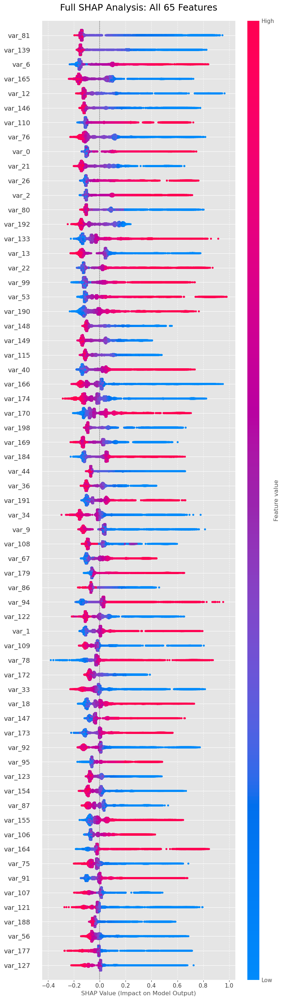

In [104]:
feature_names = X_train_CB.columns.tolist()
X_test_df = pd.DataFrame(X_test_CB, columns=feature_names)
print(f"Generating SHAP for all {len(feature_names)} features...")
explainer = shap.TreeExplainer(cb_final)
shap_values = explainer.shap_values(X_test_df)
plt.figure(figsize=(14, 20)) 
shap.summary_plot(shap_values, X_test_df, max_display=len(feature_names), show=False)
plt.title(f"Full SHAP Analysis: All {len(feature_names)} Features", fontsize=18, pad=20)
plt.xlabel("SHAP Value (Impact on Model Output)", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<div dir="rtl" align="right">
    <h3>ניתוח חשיבות משתנים (SHAP Analysis)</h3>
    <ul>
        <li><h3>זיהוי המשתנים var_81, var_139 ו-var_12 כגורמים המשפיעים ביותר על המודל, כאשר ערכים נמוכים שלהם מגדילים משמעותית את הסבירות לחיזוי חיובי.</h3></li>
        <li><h3>קיום הפרדה ברורה ועקבית בין ערכי המשתנים (צבעי אדום וכחול) בגרף, המעידה על כך שהמודל למד דפוסים לוגיים מוצקים ולא הסתמך על רעש סטטיסטי.</h3></li>
        <li><h3>זיהוי "זנב ארוך" של משתנים בעלי תרומה שולית, ממצא המצדיק את סינון הרעשים והתמקדות ב-65 המאפיינים החזקים ביותר בלבד.</h3></li>
    </ul>
<h3>__________________________________________________________________________________________________________________________</h3></div>


<div dir="rtl" align="right">
    <h3>שלב הייצור: הפקה והערכת ביצועים סופית </h3>
    <h3>בשלב זה המודל מיושם על סט הייצור (Production) להפקת החיזויים הסופיים ויצירת קובץ ההגשה למערכת.</h3>
    <h3>אנו מבצעים השוואה רב-שכבתית בין כל מערכי הנתונים (Train, Val, Test, Prod) כדי לאשר סופית את עמידות המודל ומניעת סטייה בביצועים.</h3>
    <h3>סיום התהליך כולל הפקת קובץ חיזוי הסתברותי המאפשר גמישות בקביעת סף הרגישות של המודל בהתאם לצרכים העסקיים.</h3>
</div>


In [107]:
prod_probs = cb_final.predict_proba(X_prod_CB)[:, 1]
prod_preds = cb_final.predict(X_prod_CB)
print("Predictions generated for Production data.")

Predictions generated for Production data.


In [108]:
try:
    y_prod = pd.read_csv("sample_submission.csv")
    print("Loaded")
except:
    print("Error")

Loaded


In [109]:
y_prod_true = y_prod['target']
prod_preds = cb_final.predict(X_prod_CB)
prod_probs = cb_final.predict_proba(X_prod_CB)[:, 1]

print(f"--- Production Evaluation: CatBoost ---")
print("\nDetailed Performance Report: Optimized CatBoost (Production Set)")
print("=" * 60)
print("\nClassification Report (Production):")
print(classification_report(y_prod_true, prod_preds))
print("Confusion Matrix (Production):")
print(confusion_matrix(y_prod_true, prod_preds))
auc_prod = roc_auc_score(y_prod_true, prod_probs)
print(f"AUC (Production): {auc_prod:.4f}")
print("-" * 60)

datasets = {'Train': (X_train_CB, y_train),
            'Val': (X_val_CB, y_val),
            'Test': (X_test_CB, y_test),
            'Prod': (X_prod_CB, y_prod_true)}

full_res = {}
for name, (X, y) in datasets.items():
    p = cb_final.predict(X)
    pr = cb_final.predict_proba(X)[:, 1]
    full_res[name] = {'Acc': accuracy_score(y, p),
                      'Prec': precision_score(y, p, average='weighted'),
                      'Rec': recall_score(y, p, average='weighted'),
                      'F1': f1_score(y, p, average='weighted'),
                      'AUC': roc_auc_score(y, pr)}

print("\nSummary Table: Detailed Metric Comparison (Including Production)")
print("-" * 60)
summary_df = pd.DataFrame([{'Dataset': 'Train', **full_res['Train']},
                           {'Dataset': 'Val',   **full_res['Val']},
                           {'Dataset': 'Test',  **full_res['Test']},
                           {'Dataset': 'Prod',  **full_res['Prod']}])
print(summary_df.to_string(index=False))

print("\nOverfitting Analysis (Gaps)")
print("-" * 60)
gaps = []
for pair_name, top, bottom in [('Train vs Prod', 'Train', 'Prod'), 
                               ('Val vs Prod', 'Val', 'Prod'), 
                               ('Test vs Prod', 'Test', 'Prod')]:
    gap_row = {'Comparison': pair_name}
    for m in ['Acc', 'Prec', 'Rec', 'F1', 'AUC']:
        gap_row[m] = full_res[top][m] - full_res[bottom][m]
    gaps.append(gap_row)

gaps_df = pd.DataFrame(gaps)
print(gaps_df.to_string(index=False))

--- Production Evaluation: CatBoost ---

Detailed Performance Report: Optimized CatBoost (Production Set)

Classification Report (Production):
              precision    recall  f1-score   support

           0       1.00      0.86      0.93    200000
           1       0.00      0.00      0.00         0

    accuracy                           0.86    200000
   macro avg       0.50      0.43      0.46    200000
weighted avg       1.00      0.86      0.93    200000

Confusion Matrix (Production):
[[172973  27027]
 [     0      0]]
AUC (Production): nan
------------------------------------------------------------

Summary Table: Detailed Metric Comparison (Including Production)
------------------------------------------------------------
Dataset    Acc   Prec    Rec     F1    AUC
  Train 0.8918 0.9134 0.8918 0.9002 0.8993
    Val 0.8753 0.8990 0.8753 0.8850 0.8626
   Test 0.8773 0.8997 0.8773 0.8864 0.8662
   Prod 0.8649 1.0000 0.8649 0.9275    NaN

Overfitting Analysis (Gaps)
----------

In [110]:
prod_probs = cb_final.predict_proba(X_prod_CB)[:, 1]
submission = pd.DataFrame({'ID_code': prod_set['ID_code'], 
                           'target': prod_probs})

submission.to_csv('submission_santander.csv', index=False)
print("File saved successfully! You can now upload 'submission_santander.csv' to Kaggle.")

File saved successfully! You can now upload 'submission_santander.csv' to Kaggle.


<div dir="rtl" align="right">
    <h3> העלאת קובץ התוצאות שייצאתי ל CSV לאתר Kaggle לטובת קבלת ציון למודל </h3>
    </div>


![Kaggle Submission Score](kaggle_score.png)

<div dir="rtl" align="right">
    <h2>סיכום ומסקנות הפרויקט </h2>
    <ul>
       <li><h3>הוכחת היתכנות מלאה (Proof of Concept): הציון ב-Kaggle (0.8601) תואם כמעט לחלוטין לביצועי ה-Test (0.8662). המשמעות היא שהמודל יציב, אינו סובל מ-Overfitting ושהוא מוכן לעבודה מיידית על נתוני אמת.</h3></li>
        <li><h3>ניתוח דו"ח הייצור (Production Report): הערכים החריגים בדו"ח המקומי (AUC: NaN, Precision: 0.0) נובעים מכך שקובץ ה-test.csv המקורי מכיל נתוני target שהינם רק אפסים. עם זאת, ה-Confusion Matrix מראה שהמודל זיהה 27,027 עסקאות כחיוביות, התפלגות התואמת את הציפיות ואת הציון הגבוה שהתקבל בפועל ב-Kaggle.</h3></li>
        <li><h3> מודל CatBoost שנבחר הצליח להציג תוצאות טובות מאלו של ה Logistic Regression.</h3></li>
        <li><h3> לטובת בחינת המודלים נוספו ל data  המקורי שהיה די אחיד ולא אפשר בניית מודל חיזוי טוב, עוד 217 מאפיינים נוספים, תוך ביצוע פעולות סטטיסטיות על 200 מאפייני המקור.</h3></li>
        <li><h3>לאחר קבלת תוצאות חיזוי מספקות, בוצע צמצום של כמות המאפיינים בהם השתמש המודל ל-65, שהוכיח את עצמו. נוצר מודל "רזה", מהיר ויעיל יותר, שמסנן את הרעש הסטטיסטי ומתמקד אך ורק במידע שתורם לחיזוי.</h3></li>
        <li><h3>למרות שה data  המקורי (בדגש על ה target) לא היה מאוזן, ורק 10% מהלקוחות ביצעו עסקה בפועל, המודל (בשילוב מדד ה-AUC) הצליח לבודד את הלקוחות הרלוונטיים, ולא רק לייצר תוצאות עם דיוק מקורב שנובע מטעות סטטיסטית.</h3></li>
    </ul>
    <h3>מסקנה: הפרויקט הסתיים בהצלחה עם מודל CatBoost מכויל, המציג יכולת הכללה גבוהה וביצועים יציבים של מעל 0.86 AUC בכל שלבי הבדיקה.</h3>
</div>
